# **MILESTONE - 2**

# Pre-requisite steps from Milestone-1

### Data extraction and inital imports

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import zipfile
import random
from collections import defaultdict
from tqdm import tqdm
import gc
import tensorflow as tf
from tensorflow.keras import layers, models, callbacks
from sklearn.metrics import confusion_matrix, classification_report

- Setting up directories and constants

In [ ]:
# Constants
#BASE_DIR = "/content/drive/MyDrive/Colab Notebooks/Capstone/GL_Capstone_project_Feb24B"
BASE_DIR = "/content/drive/MyDrive/GL_Capstone_project_Feb24B"
IMG_HEIGHT = 224
IMG_WIDTH = 224
CHUNK_SIZE = 500

In [ ]:
# Create necessary directories
extract_path = os.path.join(BASE_DIR, 'car_data')
annotation_dir = os.path.join(BASE_DIR, 'annotations/Annotations')
save_dir = os.path.join(BASE_DIR, 'preprocessed_data')

os.makedirs(extract_path, exist_ok=True)
os.makedirs(save_dir, exist_ok=True)

In [ ]:
# Creation of class names dataset
class_names_df=pd.read_csv(BASE_DIR + "/Car+names+and+make.csv", header=None)
class_names_df['class_index'] = class_names_df.index
class_names_df.rename(columns={'class_index':'Class_Index', 0:'Class Name'},inplace=True)
class_names_df.head()

,Class Name,Class_Index
0,AM General Hummer SUV 2000,0
1,Acura RL Sedan 2012,1
2,Acura TL Sedan 2012,2
3,Acura TL Type-S 2008,3
4,Acura TSX Sedan 2012,4


### Map training and testing images to its classes and annotations

In [ ]:
mapping_file = os.path.join(save_dir, 'class_mappings.npz')

print("Creating class mappings...")
# Load annotations
train_annot = pd.read_csv(os.path.join(annotation_dir, 'Train Annotations.csv'))
test_annot = pd.read_csv(os.path.join(annotation_dir, 'Test Annotation.csv'))

# Verify and create proper zero-based class mapping
unique_classes = sorted(train_annot['Image class'].unique())
print(f"Original annotation class range: {min(unique_classes)} to {max(unique_classes)}")

# Verify annotation indices are 1-based (1-196)
expected_classes = set(range(1, 197))
actual_classes = set(unique_classes)
if actual_classes != expected_classes:
    raise ValueError(f"Annotation classes must be 1-196. Found range: {min(unique_classes)}-{max(unique_classes)}")

# Create zero-based class mapping (0-195)
class_to_idx = {cls: idx - 1 for idx, cls in enumerate(unique_classes, 1)}
idx_to_class = {idx: cls for cls, idx in class_to_idx.items()}

# Verify mapping is zero-based
min_idx = min(idx_to_class.keys())
max_idx = max(idx_to_class.keys())
if min_idx != 0 or max_idx != 195:
    raise ValueError(f"Class indices must be 0-195. Found range: {min_idx}-{max_idx}")

# Save mappings with desired keys
np.savez(mapping_file,
         class_to_idx=class_to_idx,
         idx_to_class=idx_to_class)

print(f"Normalized class index range: {min_idx} to {max_idx}")
print("Class index validation successful!")

Creating class mappings...
Original annotation class range: 1 to 196
Normalized class index range: 0 to 195
Class index validation successful!


In [ ]:
# Process annotations with correct class indices
def process_annotations(df):
    bbox_dict = {}
    for idx, row in df.iterrows():
        img_name = row['Image Name']
        bbox = [
            row['Bounding Box coordinates'],  # xmin
            row['Unnamed: 2'],               # ymin
            row['Unnamed: 3'],               # xmin
            row['Unnamed: 4']                # ymin
        ]
        bbox_dict[img_name] = {
            'bbox': bbox,
            'class_idx': row['Image class']
        }
    return bbox_dict

In [ ]:
# Create mappings
train_bbox_mapping = process_annotations(train_annot)
test_bbox_mapping = process_annotations(test_annot)

print("Annotation Statistics:")
print(f"Number of training annotations: {len(train_bbox_mapping)}")
print(f"Number of testing annotations: {len(test_bbox_mapping)}")

Annotation Statistics:
Number of training annotations: 8144
Number of testing annotations: 8041


### Collecting image paths

In [ ]:
def collect_image_paths(directory):
    """Collect image paths with their metadata"""
    image_paths = []
    for car_model in os.listdir(directory):
        car_model_path = os.path.join(directory, car_model)
        if os.path.isdir(car_model_path):
            for image in os.listdir(car_model_path):
                if image.lower().endswith(('.png', '.jpg', '.jpeg')) and not image.startswith('.'):
                    image_paths.append({
                        'path': os.path.join(car_model_path, image),
                        'class': car_model,
                        'filename': image
                    })
    return image_paths

In [ ]:
# Collect paths for train and test sets
train_dir = os.path.join(extract_path, 'Car Images', 'Train Images')
test_dir = os.path.join(extract_path, 'Car Images', 'Test Images')
train_images = collect_image_paths(train_dir)
test_images = collect_image_paths(test_dir)

print(f"Found {len(train_images)} training images and {len(test_images)} testing images")

Found 8144 training images and 8041 testing images


### Train and Test Datasets creation

In [ ]:
# 1. Dataset Creation Function
def create_datasets(num_classes=16, batch_size=32, model_type='basic'):
    """Create TensorFlow datasets with model-specific preprocessing"""
    X_train, y_train = [], []
    X_test, y_test = [], []

    # Process training chunks
    train_chunks = sorted([f for f in os.listdir(save_dir) if f.startswith('train_chunk_')])
    for chunk in tqdm(train_chunks, desc="Loading training chunks"):
        data = np.load(os.path.join(save_dir, chunk))
        mask = data['y'] < num_classes
        X_train.extend(data['X'][mask])
        y_train.extend(data['y'][mask])

    # Process test chunks
    test_chunks = sorted([f for f in os.listdir(save_dir) if f.startswith('test_chunk_')])
    for chunk in tqdm(test_chunks, desc="Loading testing chunks"):
        data = np.load(os.path.join(save_dir, chunk))
        mask = data['y'] < num_classes
        X_test.extend(data['X'][mask])
        y_test.extend(data['y'][mask])

    # Convert to arrays
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # Create TF datasets
    train_ds = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    test_ds = tf.data.Dataset.from_tensor_slices((X_test, y_test))

    # Apply model-specific preprocessing
    if model_type == 'resnet':
        train_ds = train_ds.map(
            lambda x, y: (tf.keras.applications.resnet50.preprocess_input(x * 255.0), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )
        test_ds = test_ds.map(
            lambda x, y: (tf.keras.applications.resnet50.preprocess_input(x * 255.0), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )
    elif model_type == 'efficientnet':
        train_ds = train_ds.map(
            lambda x, y: (tf.keras.applications.vgg16.preprocess_input(x * 255.0), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )
        test_ds = test_ds.map(
            lambda x, y: (tf.keras.applications.vgg16.preprocess_input(x * 255.0), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )
    elif model_type == 'mobilenet':
        train_ds = train_ds.map(
            lambda x, y: (tf.keras.applications.mobilenet_v2.preprocess_input(x * 255.0), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )
        test_ds = test_ds.map(
            lambda x, y: (tf.keras.applications.mobilenet_v2.preprocess_input(x * 255.0), y),
            num_parallel_calls=tf.data.AUTOTUNE
        )

    # Final dataset preparation
    train_ds = train_ds.shuffle(buffer_size=len(X_train))
    train_ds = train_ds.batch(batch_size)
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)

    test_ds = test_ds.batch(batch_size)
    test_ds = test_ds.prefetch(tf.data.AUTOTUNE)

    print(f"\nDataset Statistics:")
    print(f"Training samples: {len(X_train)}")
    print(f"Testing samples: {len(X_test)}")
    print(f"Number of classes: {num_classes}")

    return train_ds, test_ds

## Model Train Functions

In [ ]:
# Training and Evaluation Functions
def train_model(model, train_ds, test_ds, model_name, epochs):
    """Train model with improved callbacks and monitoring"""
    # Create directories for saving
    model_dir = os.path.join(save_dir, model_name)
    os.makedirs(model_dir, exist_ok=True)

    callbacks_list = [
        callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=7,  # Increased patience
            restore_best_weights=True,
            verbose=1
        ),
        callbacks.ReduceLROnPlateau(
            monitor='val_accuracy',
            factor=0.2,  # More aggressive LR reduction
            patience=3,
            min_lr=1e-7,
            verbose=1
        ),
        callbacks.ModelCheckpoint(
            os.path.join(model_dir, f'{model_name}_best.keras'), # It picks up the training from prev checkpoint
            monitor='val_accuracy',
            save_best_only=True,
            verbose=1
        ),
        callbacks.CSVLogger(
            os.path.join(model_dir, f'{model_name}_training_log.csv'),
            separator=',',
            append=False
        )
    ]

    # Train with try-except for better error handling
    try:
        history = model.fit(
            train_ds,
            epochs=epochs,
            validation_data=test_ds,
            callbacks=callbacks_list,
            verbose=1
        )

        # Save training history
        history_dict = history.history
        np.save(os.path.join(model_dir, f'{model_name}_history.npy'), history_dict)

        return history

    except Exception as e:
        print(f"Error during training: {str(e)}")
        return None

In [ ]:
def evaluate_model(model, test_ds, idx_to_class):
    """Evaluate model and show metrics"""
    # Get predictions
    all_labels = []
    all_preds = []

    for images, labels in test_ds:
        preds = model.predict(images)
        pred_classes = np.argmax(preds, axis=1)

        all_labels.extend(labels.numpy())
        all_preds.extend(pred_classes)

    # Convert to arrays
    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)

    # Create class names list
    unique_labels = sorted(list(set(all_labels)))
    class_names = [idx_to_class[i] for i in unique_labels]

    # Plot confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(12, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    # Print classification report
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds,
                              target_names=[idx_to_class[i] for i in range(len(unique_labels))],
                              zero_division=0))

    # Print overall accuracy
    accuracy = np.mean(all_labels == all_preds)
    print(f"\nOverall Accuracy: {accuracy:.4f}")

    return cm

In [ ]:
def visualize_predictions(model, test_ds, idx_to_class, num_samples=5):
    """Show sample predictions"""
    for images, labels in test_ds.take(1):
        predictions = model.predict(images[:num_samples])

        plt.figure(figsize=(20, 4))
        for i in range(num_samples):
            plt.subplot(1, num_samples, i + 1)

            # Display image
            plt.imshow(images[i])
            plt.axis('off')

            # Get predicted and true class names
            predicted_class = idx_to_class[np.argmax(predictions[i])]
            true_class = idx_to_class[labels[i].numpy()]

            # Get prediction probability
            pred_prob = np.max(predictions[i]) * 100

            # Color code based on correctness
            color = 'green' if predicted_class == true_class else 'red'
            plt.title(f'Pred: {predicted_class}\nTrue: {true_class}\nConf: {pred_prob:.1f}%',
                     color=color, fontsize=8)

        plt.tight_layout()
        plt.show()

In [ ]:
def summarize_results(model_histories):
    """Summarize training results for all models"""
    results = []

    for model_name, history in model_histories.items():
        # Get best validation accuracy
        best_val_acc = max(history.history['val_accuracy'])
        best_epoch = history.history['val_accuracy'].index(best_val_acc) + 1

        # Get final training accuracy
        final_train_acc = history.history['accuracy'][-1]

        # Get total training time (if available)
        total_epochs = len(history.history['accuracy'])

        results.append({
            'Model': model_name,
            'Best Val Accuracy': f"{best_val_acc:.4f}",
            'Final Train Accuracy': f"{final_train_acc:.4f}",
            'Best Epoch': best_epoch,
            'Total Epochs': total_epochs
        })

    # Create DataFrame and display results
    results_df = pd.DataFrame(results)
    print("\nModel Training Results Summary:")
    print("="*80)
    print(results_df)

    return results_df

## Basic ResNet50 Model Design and Train

In [ ]:
# Create datasets for resnet50
train_ds, test_ds = create_datasets(
    num_classes=16,
    model_type='resnet'
)

Loading testing chunks: 100%|██████████| 17/17 [00:45<00:00,  2.67s/it]



Dataset Statistics:
Training samples: 652
Testing samples: 646
Number of classes: 16


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import img_to_array, load_img


In [ ]:
num_classes = 16

# Load ResNet50 base model
resnet50_base_model = ResNet50(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
resnet50_base_model.trainable = False

# Add few classification layers
x = resnet50_base_model.output
x = GlobalAveragePooling2D()(x)  # Pooling layer
predictions = Dense(num_classes, activation="softmax")(x)  # Output layer

# Build the model
resnet50_base_model = Model(inputs=resnet50_base_model.input, outputs=predictions)

In [ ]:
#Compile the model
resnet50_base_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [ ]:
# Train the model
history = resnet50_base_model.fit(
    train_ds,
    epochs=10,
    verbose=1,
    validation_data=test_ds,
)


Epoch 1/10
21/21 [==============================] - 227s 11s/step - loss: 2.6499 - accuracy: 0.1810 - val_loss: 2.1840 - val_accuracy: 0.3158
Epoch 2/10
21/21 [==============================] - 219s 11s/step - loss: 1.6613 - accuracy: 0.5092 - val_loss: 1.8105 - val_accuracy: 0.4427
Epoch 3/10
21/21 [==============================] - 216s 11s/step - loss: 1.2889 - accuracy: 0.6242 - val_loss: 1.6006 - val_accuracy: 0.5155
Epoch 4/10
21/21 [==============================] - 217s 11s/step - loss: 0.9936 - accuracy: 0.7485 - val_loss: 1.4442 - val_accuracy: 0.5526
Epoch 5/10
21/21 [==============================] - 217s 11s/step - loss: 0.8304 - accuracy: 0.8206 - val_loss: 1.3601 - val_accuracy: 0.5898
Epoch 6/10
21/21 [==============================] - 217s 11s/step - loss: 0.6825 - accuracy: 0.8758 - val_loss: 1.3517 - val_accuracy: 0.5604
Epoch 7/10
21/21 [==============================] - 219s 11s/step - loss: 0.6202 - accuracy: 0.8926 - val_loss: 1.2899 - val_accuracy: 0.5789
Epoch 

In [ ]:
# Model Training Results Summary
results = []

# Get best validation accuracy
best_val_acc = max(history.history['val_accuracy'])
best_epoch = history.history['val_accuracy'].index(best_val_acc) + 1
final_train_acc = history.history['accuracy'][-1]
total_epochs = len(history.history['accuracy'])

results.append({
    'Model': 'ResNet50',
    'Best Val Accuracy': f"{best_val_acc:.4f}",
    'Final Train Accuracy': f"{final_train_acc:.4f}",
    'Best Epoch': best_epoch,
    'Total Epochs': total_epochs
})

# Create DataFrame and display results
results_df = pd.DataFrame(results)
print("\nModel Training Results Summary:")
print("="*80)
print(results_df)


Model Training Results Summary:
      Model Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
0  ResNet50            0.6254               0.9479          10            10


**Basic ResNet50 model results summary**

      Model Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
      ResNet50       0.6254          0.9479             10          10

# Step 1: FineTune, train and test basic CNN models to classify the car

Below were the basic CNN models that have been created in Milestone-1 for the car classification problem. The highlighted models have been finetuned and their validation accuracies have been observed. ResNet50 being the top performing model, the predictions are made using it.


1. Basic CNN
2. VGG16
3. ***ResNet50***
4. ***MobileNetV2***
5. ***EfficientNetV2B0***

In the initial analysis, among all the models, ResNet50 and MobileNetV2 have shown good results for this particular problem statement. These ImageNet models are pre-trained on similar datasets and have shown good results with a initial fine tuning.

In further steps, these 3 models will be hyperparameter tuned for boosting the Validation accuracy. Based on the best val_accuracy achieved, the further training would be done for selected models.

ResNet50 stood to be the best model with highest val_accuracy. For further analysis of the model, the below 2 model versions are created and the metrics such as Training accuracy and Val_accuracy are compared.
- a base model without any extra layers
- a hyperparameter tuned ResNet50 model

Note: Further insights over this are captured at the end of the notebook.

Hyperparameters and their	Range/Values
- dropout_rate :	[0.3–0., step=0.1]
- learning_rate :	[1e-2, 1e-3, 1e-4, 1e-5]
- dense_units : [128 to 1024, step=256]

In [ ]:
# Initial import statements
!pip install -q -U keras-tuner
import keras_tuner as kt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.3 MB/s eta 0:00:00


In [ ]:
MODEL_BASE_DIR = "/content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/"
BASE_DIR = "/content/drive/MyDrive/GL_Capstone_project_Feb24B"
save_dir = os.path.join(BASE_DIR, 'preprocessed_data')
img_height = 224
img_width = 224
num_classes = 16

### EfficientNetV2B0 Fine-Tuning

Best val_accuracy reported after hyperparameter tuning : 0.4659

In [ ]:
# Create datasets for efficientnet
train_ds, test_ds = create_datasets(
    num_classes=16,
    model_type='efficientnet'
)

Loading testing chunks: 100%|██████████| 17/17 [00:45<00:00,  2.67s/it]



Dataset Statistics:
Training samples: 652
Testing samples: 646
Number of classes: 16


In [ ]:
def build_model(hp):
  #Hyperparameter turning for ResNet50
    base_model = tf.keras.applications.EfficientNetV2B0(
        input_shape=(224, 224, 3),
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = False

    # Define the model
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
    #x = layers.Flatten()(x)    #Flatten the output of basemodel - use when not using GlobalAveragePooling2D

    # Dense layer with tunable units
    #dense_units = hp.Int('dense_units', min_value=256, max_value=1024, step=128)
    x = layers.Dense(512)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Dropout rate
    dropout_rate = hp.Float('dropout_rate', min_value=0.3, max_value=0.7, step=0.1)
    x = layers.Dropout(dropout_rate)(x)

    # Output layer for classification
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Compile model
    model = tf.keras.Model(inputs, outputs)
    learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

#Define tuner
tuner = kt.Hyperband(
      build_model,
      objective='val_accuracy',
      max_epochs=5,
      factor=2,
      directory=os.path.join(MODEL_BASE_DIR,"efficientnetb0"),
      project_name='efficientnetb0_hptune'
      )

# Search for best hyperparameters
tuner.search(train_ds, validation_data=test_ds, epochs=10)

# Save the best hyperparameters
best_params = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"Best dropout rate: {best_params.get('dropout_rate')}")
print(f"Best learning rate: {best_params.get('learning_rate')}")

# Building the model with the best hyperparameters
best_ftmodel = tuner.hypermodel.build(best_params)
best_ftmodel.summary()

Trial 21 Complete [00h 11m 01s]
val_accuracy: 0.34210526943206787

Best val_accuracy So Far: 0.4659442603588104
Total elapsed time: 02h 07m 18s
Best dropout rate: 0.4
Best learning rate: 0.001


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficientnetv2-b0 (Functional)       │ (None, 7, 7, 1280)          │       5,919,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,585,440 (25.12 MB)

 Trainable params: 665,104 (2.54 MB)

 Non-trainable params: 5,920,336 (22.58 MB)

### MobileNetv2 Fine-Tuning

MobileNetv2 Finetuned Model Training Results Summary:

     Model        Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
     ft_mobilenet            0.3467               0.9969          20   20

In [ ]:
# Create datasets for mobilenet
train_ds, test_ds = create_datasets(
    num_classes=16,
    model_type='mobilenet'
)

Loading testing chunks: 100%|██████████| 17/17 [00:45<00:00,  2.67s/it]



Dataset Statistics:
Training samples: 652
Testing samples: 646
Number of classes: 16


In [ ]:
def build_model(hp):
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=(224, 224, 3),
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = True

    # Define the model
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = base_model(inputs, training=True)
    x = layers.GlobalAveragePooling2D()(x)
    # x = layers.Flatten()(x)

    # Dense layer with tunable units
    #dense_units = hp.Int('dense_units', min_value=256, max_value=1024, step=256)
    x = layers.Dense(512)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Dropout rate
    dropout_rate = hp.Float('dropout_rate', min_value=0.3, max_value=0.6, step=0.1)
    x = layers.Dropout(dropout_rate)(x)

    # Output layer for classification
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Compile model
    model = tf.keras.Model(inputs, outputs)
    learning_rate_choices = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate_choices),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

#Define tuner
tuner = kt.RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=5,
    directory=os.path.join(MODEL_BASE_DIR,"mobilenetv2"),
    project_name='mobilenet_ftun'
)

# Search for best hyperparameters
tuner.search(train_ds, validation_data=test_ds, epochs=5)

# Saving the best hyperparameters
best_params = tuner.get_best_hyperparameters(num_trials=1)[0]



Trial 5 Complete [00h 17m 17s]
val_accuracy: 0.2693498432636261

Best val_accuracy So Far: 0.2693498432636261
Total elapsed time: 01h 24m 56s


In [ ]:
print(f"Best dropout rate: {best_params.get('dropout_rate')}")
print(f"Best learning rate: {best_params.get('learning_rate')}")

# Building the model with the best hyperparameters
best_ftmodel = tuner.hypermodel.build(best_params)
best_ftmodel.summary()

Best dropout rate: 0.4
Best learning rate: 0.001


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,924,112 (11.15 MB)

 Trainable params: 2,888,976 (11.02 MB)

 Non-trainable params: 35,136 (137.25 KB)

In [ ]:
ft_mobilenet_model = best_ftmodel

In [ ]:
# Training the Finetuned MobileNetV2 Model
def train_ft_model(model, model_name, epochs=20):
  model_histories = {}
  print(f"\n{'='*50}")
  print(f"Training {model_name.upper()}")
  print('='*50)

  try:
    # Create and train model
    print(f"\nModel Summary for {model_name.upper()}:")
    model.summary()
    history = train_model(model, train_ds, test_ds, model_name, epochs)

    if history is not None:
        # Store history
        model_histories[model_name] = history

        # Evaluate model
        print(f"\nEvaluating {model_name.upper()}")
        evaluate_model(model, test_ds, idx_to_class)

        # Show predictions
        print(f"\nSample predictions for {model_name.upper()}")
        visualize_predictions(model, test_ds, idx_to_class)

  except Exception as e:
    print(f"Error processing {model_name}: {str(e)}")

  finally:
    # Clear memory
    tf.keras.backend.clear_session()
    gc.collect()

  # Summarize results
  if model_histories:
    results_df = summarize_results(model_histories)

  # Save results to CSV
  results_df.to_csv(os.path.join(save_dir, 'model_comparison_results.csv'), index=False)
  print("\nResults saved to 'model_comparison_results.csv'")

  return model_histories


Training FT_MOBILENET

Model Summary for FT_MOBILENET:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ mobilenetv2_1.00_224 (Functional)    │ (None, 7, 7, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,924,112 (11.15 MB)

 Trainable params: 2,888,976 (11.02 MB)

 Non-trainable params: 35,136 (137.25 KB)

Epoch 1/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.2114 - loss: 2.8146
Epoch 1: val_accuracy improved from -inf to 0.15325, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B_dup/GL_Capstone_project_Feb24B/preprocessed_data/ft_mobilenet/ft_mobilenet_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 227s 9s/step - accuracy: 0.2154 - loss: 2.7953 - val_accuracy: 0.1533 - val_loss: 4.7819 - learning_rate: 0.0010
Epoch 2/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.6794 - loss: 0.9559
Epoch 2: val_accuracy improved from 0.15325 to 0.20124, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B_dup/GL_Capstone_project_Feb24B/preprocessed_data/ft_mobilenet/ft_mobilenet_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 195s 9s/step - accuracy: 0.6800 - loss: 0.9550 - val_accuracy: 0.2012 - val_loss: 5.2272 - learning_rate: 0.0010
Epoch 3/20
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 7s/step - accuracy: 0.8777 - loss: 0.3772
Epoch 3: val_accuracy improved from 0.20124 to 0.21981, sa

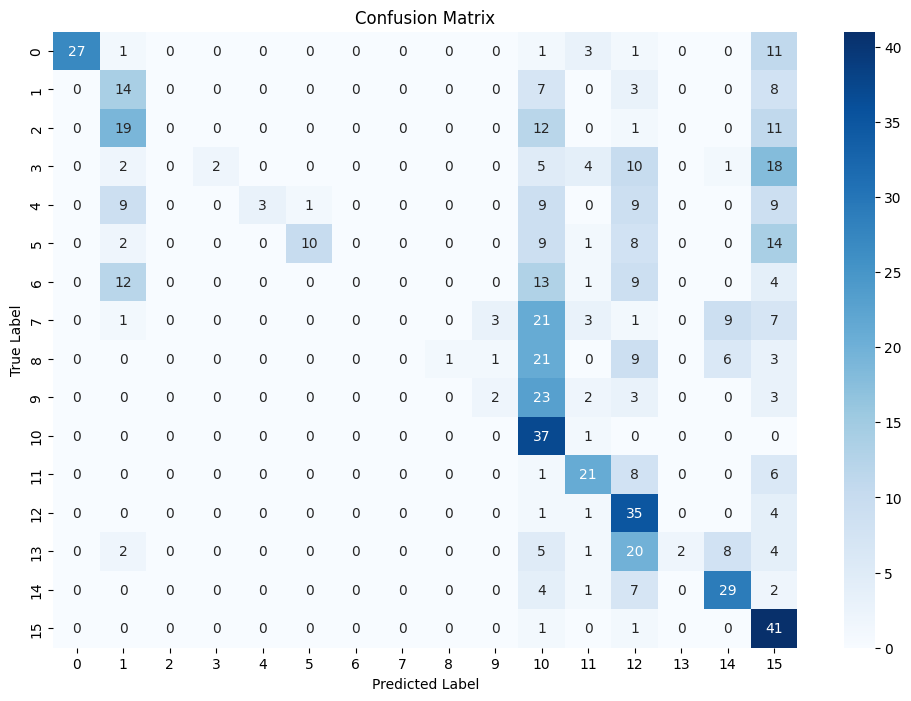


Classification Report:
Error processing ft_mobilenet: object of type 'numpy.int64' has no len()

Model Training Results Summary:
          Model Best Val Accuracy Final Train Accuracy  Best Epoch  \
0  ft_mobilenet            0.3467               0.9969          20   

   Total Epochs  
0            20  

Results saved to 'model_comparison_results.csv'


{'ft_mobilenet': <keras.src.callbacks.history.History at 0x7d7e5ac87d60>}

In [ ]:
train_ft_model(ft_mobilenet_model, 'ft_mobilenet')

### ResNet50 Fine-Tuning

ResNet50_Finetuned Model Training Results Summary


        Model Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
        resnet_hpt      0.6920               0.9923           3             5

In [ ]:
# Create datasets for resnet50
train_ds, test_ds = create_datasets(
    num_classes=16,
    model_type='resnet'
)

Loading testing chunks: 100%|██████████| 17/17 [00:45<00:00,  2.67s/it]



Dataset Statistics:
Training samples: 652
Testing samples: 646
Number of classes: 16


In [ ]:
def build_model(hp):

    base_model = tf.keras.applications.ResNet50(
        input_shape=(224, 224, 3),
        include_top=False,
        weights='imagenet'
    )
    base_model.trainable = False

    # Define the model
    inputs = tf.keras.Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)
  #  x = layers.Flatten()(x)

    #Dense units
    dense_units = hp.Int('dense_units', min_value=128, max_value=1024, step=256)
    x = layers.Dense(dense_units)(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)

    # Dropout rate
    dropout_rate = hp.Float('dropout_rate', min_value=0.3, max_value=0.6, step=0.1)
    x = layers.Dropout(dropout_rate)(x)

    # Output layer for classification
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Compile model
    model = tf.keras.Model(inputs, outputs)
    #learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5])
    learning_rate = 1e-3

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=learning_rate),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

#Define tuner
tuner = kt.Hyperband(
      build_model,
      objective='val_accuracy',
      max_epochs=5,
      factor=2,
      directory=os.path.join(MODEL_BASE_DIR,"resnet50"),
      project_name='resnet50_dense_dropout'
      )

# Search for best hyperparameters
tuner.search(train_ds, validation_data=test_ds, epochs=10)



Trial 19 Complete [00h 25m 15s]
val_accuracy: 0.6439628601074219

Best val_accuracy So Far: 0.6439628601074219
Total elapsed time: 03h 46m 49s


In [ ]:
# Print all the trial paramters
trials = tuner.oracle.trials
print("All parameter combinations:")
for trial_id, trial in trials.items():
    print(f"Trial {trial_id}: {trial.hyperparameters.values}")
    trial.
print("Total number of trials:", len(trials))


All parameter combinations:
Trial 0000: {'dense_units': 1024, 'dropout_rate': 0.4, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}
Trial 0001: {'dense_units': 512, 'dropout_rate': 0.3, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}
Trial 0002: {'dense_units': 512, 'dropout_rate': 0.5, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}
Trial 0003: {'dense_units': 768, 'dropout_rate': 0.4, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}
Trial 0004: {'dense_units': 768, 'dropout_rate': 0.5, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}
Trial 0005: {'dense_units': 256, 'dropout_rate': 0.3, 'tuner/epochs': 2, 'tuner/initial_epoch': 0, 'tuner/bracket': 2, 'tuner/round': 0}
Trial 0006: {'dense_units': 256, 'dropout_rate': 0.3, 'tuner/epochs': 3, 'tuner/initial_epoch': 2, 'tuner/bracket': 2, 'tuner/round': 1, 'tuner/trial

In [ ]:
# Get the best hyperparameters
best_params = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Best dense units: {best_params.get('dense_units')}")
print(f"Best dropout rate: {best_params.get('dropout_rate')}")
#print(f"Best learning rate: {best_params.get('learning_rate')}")


# Building the model with the best hyperparameters
best_ftmodel = tuner.hypermodel.build(best_params)
best_ftmodel.summary()

Best dense units: 512
Best dropout rate: 0.4


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,647,056 (94.02 MB)

 Trainable params: 1,058,320 (4.04 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

In [ ]:
# Training the ResNet50 Fine Tuned model
def train_ft_model(model, model_name,train_ds=train_ds, epochs=10):
  model_histories = {}
  print(f"\n{'='*50}")
  print(f"Training {model_name.upper()}")
  print('='*50)

  try:
    # Create and train model
    print(f"\nModel Summary for {model_name.upper()}:")
    model.summary()
    history = train_model(model, train_ds, test_ds, model_name, epochs)

    if history is not None:
        model_histories[model_name] = history

        # Evaluate model
        print(f"\nEvaluating {model_name.upper()}")
        evaluate_model(model, test_ds, idx_to_class)

        # Show predictions
        print(f"\nSample predictions for {model_name.upper()}")
        visualize_predictions(model, test_ds, idx_to_class)

  except Exception as e:
    print(f"Error processing {model_name}: {str(e)}")

  finally:
    # Clear memory
    tf.keras.backend.clear_session()
    gc.collect()

  # Summarize results
  if model_histories:
    results_df = summarize_results(model_histories)

  # Save results to CSV
  results_df.to_csv(os.path.join(save_dir, 'model_comparison_results.csv'), index=False)
  print("\nResults saved to 'model_comparison_results.csv'")

  return model_histories

In [ ]:
resnet_hpt= best_ftmodel


Training RESNET_HPT

Model Summary for RESNET_HPT:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 24,647,056 (94.02 MB)

 Trainable params: 1,058,320 (4.04 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

Epoch 1/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.2496 - loss: 2.6018
Epoch 1: val_accuracy improved from -inf to 0.41176, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/resnet_hpt/resnet_hpt_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 276s 13s/step - accuracy: 0.2528 - loss: 2.5892 - val_accuracy: 0.4118 - val_loss: 1.8679 - learning_rate: 0.0010
Epoch 2/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.7675 - loss: 0.7684
Epoch 2: val_accuracy improved from 0.41176 to 0.48762, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/resnet_hpt/resnet_hpt_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 329s 13s/step - accuracy: 0.7668 - loss: 0.7688 - val_accuracy: 0.4876 - val_loss: 1.6145 - learning_rate: 0.0010
Epoch 3/10
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.8986 - loss: 0.4085
Epoch 3: val_accuracy improved from 0.48762 to 0.54180, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/prep

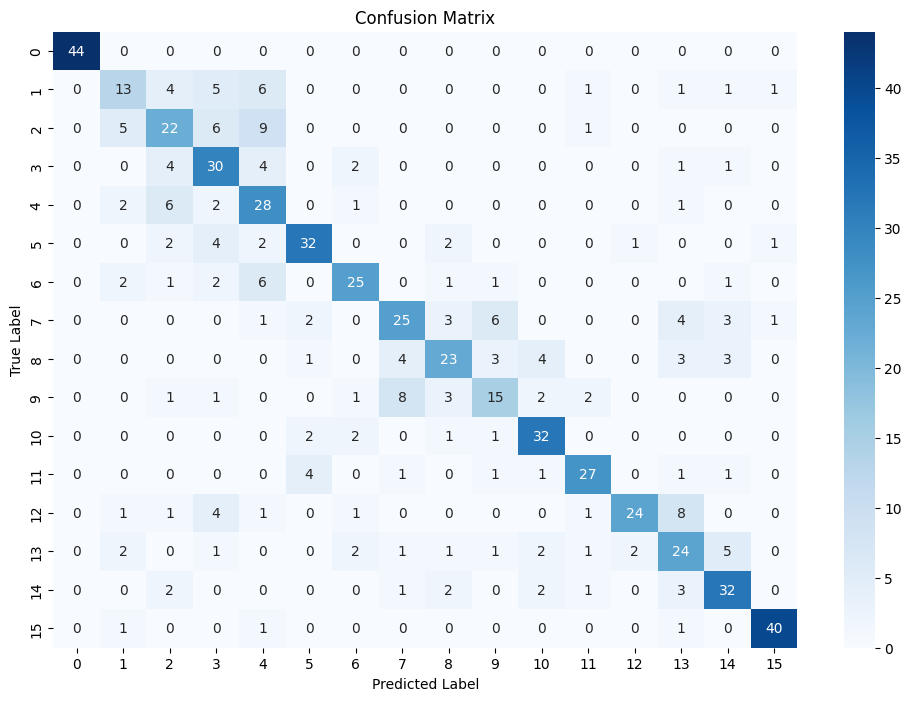


Classification Report:
Error processing resnet_hpt: object of type 'numpy.int64' has no len()

Model Training Results Summary:
        Model Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
0  resnet_hpt            0.6749               0.9908           9            10

Results saved to 'model_comparison_results.csv'


{'resnet_hpt': <keras.src.callbacks.history.History at 0x7f4129eb5c60>}

In [ ]:
train_ft_model(resnet_hpt, 'resnet_hpt', epochs=10)


Training RESNET_HPT

Model Summary for RESNET_HPT:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,763,698 (102.10 MB)

 Trainable params: 1,058,320 (4.04 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

 Optimizer params: 2,116,642 (8.07 MB)

Epoch 1/2
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9982 - loss: 0.0372
Epoch 1: val_accuracy improved from -inf to 0.68576, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/resnet_hpt/resnet_hpt_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 273s 13s/step - accuracy: 0.9981 - loss: 0.0375 - val_accuracy: 0.6858 - val_loss: 1.0627 - learning_rate: 0.0010
Epoch 2/2
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9977 - loss: 0.0342
Epoch 2: val_accuracy did not improve from 0.68576
21/21 ━━━━━━━━━━━━━━━━━━━━ 271s 13s/step - accuracy: 0.9976 - loss: 0.0343 - val_accuracy: 0.6734 - val_loss: 1.0486 - learning_rate: 0.0010
Restoring model weights from the end of the best epoch: 1.

Evaluating RESNET_HPT
1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/st

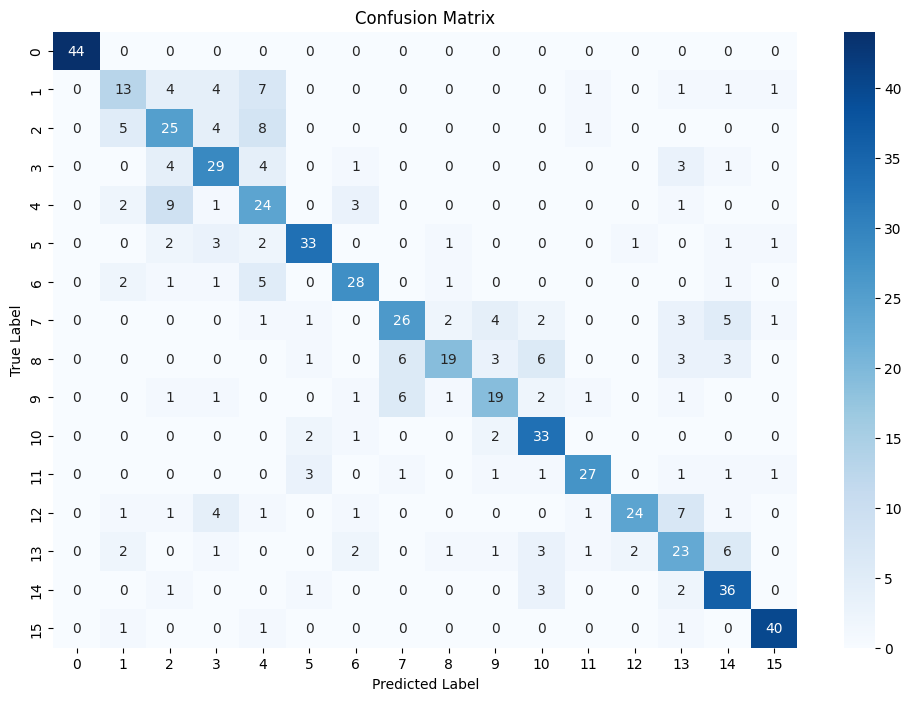


Classification Report:
Error processing resnet_hpt: object of type 'numpy.int64' has no len()

Model Training Results Summary:
        Model Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
0  resnet_hpt            0.6858               0.9969           1             2

Results saved to 'model_comparison_results.csv'


{'resnet_hpt': <keras.src.callbacks.history.History at 0x7f412bb9ca30>}

In [ ]:
train_ft_model(resnet_hpt, 'resnet_hpt', epochs=2)


Training RESNET_HPT

Model Summary for RESNET_HPT:


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 7, 7, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 2048)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 16)                  │           8,208 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 26,763,698 (102.10 MB)

 Trainable params: 1,058,320 (4.04 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

 Optimizer params: 2,116,642 (8.07 MB)

Epoch 1/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9966 - loss: 0.0348
Epoch 1: val_accuracy improved from -inf to 0.67802, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/resnet_hpt/resnet_hpt_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 273s 13s/step - accuracy: 0.9964 - loss: 0.0351 - val_accuracy: 0.6780 - val_loss: 1.0354 - learning_rate: 0.0010
Epoch 2/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9958 - loss: 0.0348
Epoch 2: val_accuracy improved from 0.67802 to 0.67957, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/resnet_hpt/resnet_hpt_best.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 272s 13s/step - accuracy: 0.9958 - loss: 0.0349 - val_accuracy: 0.6796 - val_loss: 1.0447 - learning_rate: 0.0010
Epoch 3/5
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.9986 - loss: 0.0239
Epoch 3: val_accuracy improved from 0.67957 to 0.69195, saving model to /content/drive/MyDrive/GL_Capstone_project_Feb24B/preproc

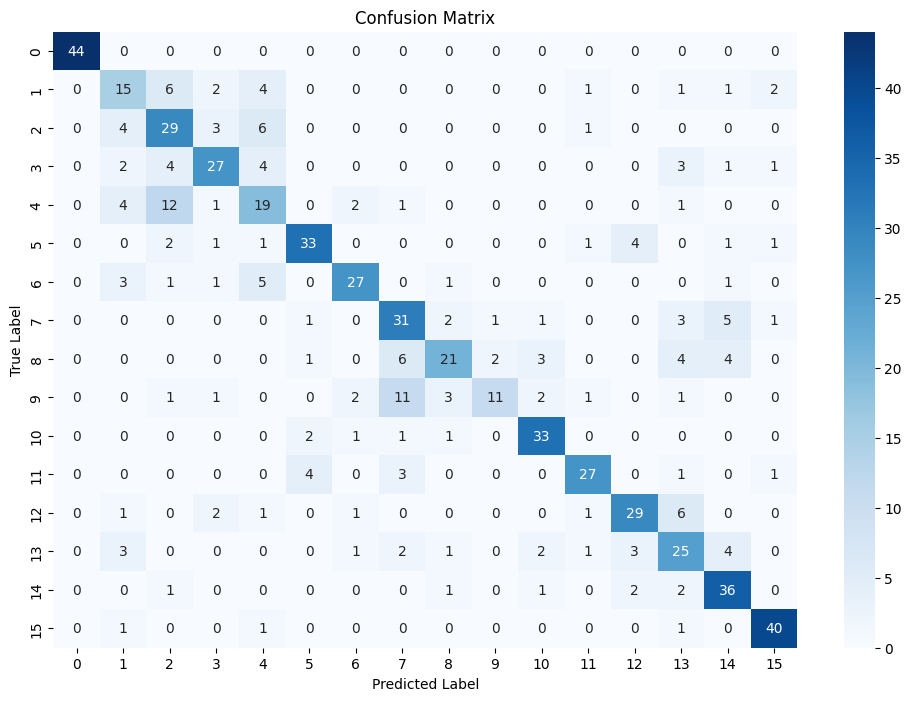


Classification Report:
Error processing resnet_hpt: object of type 'numpy.int64' has no len()

Model Training Results Summary:
        Model Best Val Accuracy Final Train Accuracy  Best Epoch  Total Epochs
0  resnet_hpt            0.6920               0.9923           3             5

Results saved to 'model_comparison_results.csv'


{'resnet_hpt': <keras.src.callbacks.history.History at 0x7f41484b29e0>}

In [ ]:
train_ft_model(resnet_hpt, 'resnet_hpt', epochs=5)

### ResNet50 FineTuned Model Predictions

 The highlighted models above have been finetuned and their validation accuracies have been observed and compared.

 Among all, ResNet50 has been the top performing model with an accuracy ~70%. Hence, this model is chosen as the best model among the fine-tuned ones and the predictions are made using it on a few sample Test images for the Car Classification Task.

In [ ]:
import keras
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.applications.resnet50 import preprocess_input
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [ ]:
# Single image prediction

def loadimage_and_predict(sample_image_path,model):
  sample_image = load_img(sample_image_path, target_size=(224, 224))
  sample_image_array = tf.keras.utils.img_to_array(sample_image)
  sample_image_array = np.expand_dims(sample_image_array, axis=0)
  sample_image_array = preprocess_input(sample_image_array)  # ResNet50 preprocessing

    # Make a prediction
  prediction = model.predict(sample_image_array)
  predicted_class_idx = np.argmax(prediction, axis=1)[0]
  predicted_class_name = idx_to_class[predicted_class_idx]

  print("Predicted Class Name:")
  print()
  #print(f"Predicted Class Name: {predicted_class_name}")

  for item in test_images:
          if item['path'] == sample_image_path:
              title=  f"Actual_Class: {item['class']}" + "\n" + f"Predicted_class: {class_names_df.loc[predicted_class_idx,'Class Name']}"
              class_name = item['class']
              break
  img = Image.open(sample_image_path)
  plt.imshow(img)
  plt.axis('off')
  plt.title(f"{title}")
  plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 210ms/step
Predicted Class Name:



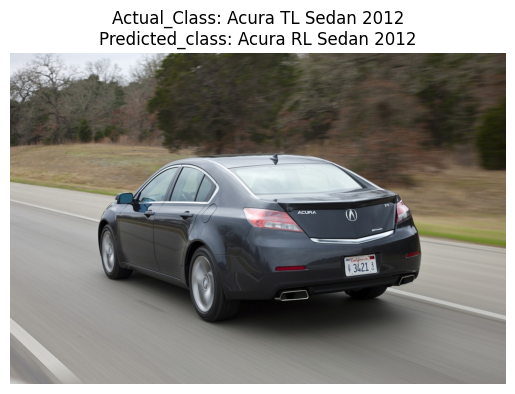

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
Predicted Class Name:



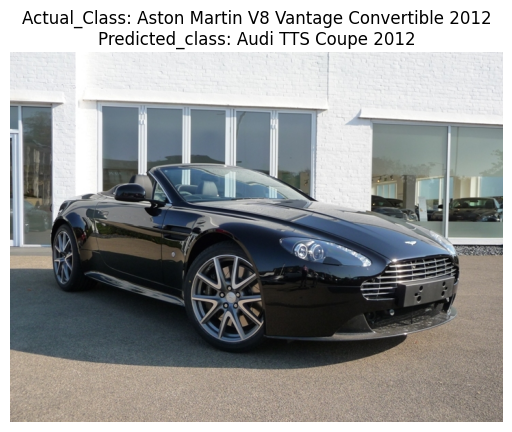

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Predicted Class Name:



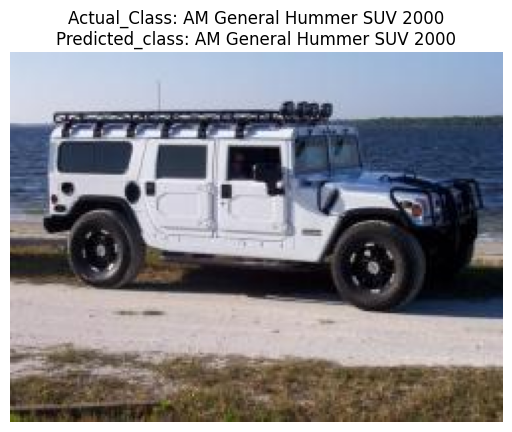

In [ ]:
# Load and predict a few sample test images using the Resnet50 finetuned model
sample_image_paths = [
    os.path.join(test_dir,'Acura TL Sedan 2012/00043.jpg'),
    os.path.join(test_dir,'Aston Martin V8 Vantage Convertible 2012/00239.jpg'),
    os.path.join(test_dir,'AM General Hummer SUV 2000/01199.jpg')
    ]

for img_path in sample_image_paths:
  loadimage_and_predict(img_path,resnet_hpt)

## Classification Report for ResNet50_FineTuned Predictions


**Overall Metrics Achieved**

- Precision: 0.7037
- Recall: 0.6919
- F1-Score: 0.6897
- Accuracy: 0.6919

In [ ]:
idx_to_class = class_names_df['Class Name'].tolist()

In [ ]:
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    precision_score,
    recall_score,
    f1_score,
)


#Evaluate model and show metrics
def evaluate_model(model, test_ds, idx_to_class):
    # Get predictions
    all_labels = []
    all_preds = []

    for images, labels in test_ds:
        preds = model.predict(images)
        pred_classes = np.argmax(preds, axis=1)

        all_labels.extend(labels.numpy())
        all_preds.extend(pred_classes)

    # Convert to arrays
    all_labels = np.array(all_labels)
    all_preds = np.array(all_preds)

    # Create class names list
    unique_labels = sorted(list(set(all_labels)))
    class_names = [idx_to_class[i] for i in unique_labels]

    # Plotting the confusion matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(12, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

    # To Print classification report
    print("\nClassification Report:")
    print(classification_report(all_labels, all_preds,
                              target_names=[idx_to_class[i] for i in range(len(unique_labels))],
                              zero_division=0))

    # Calculate and print overall metrics
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

    print(f"\nOverall Metrics:")
    print(f"Precision: {precision}")
    print(f"Recall: {recall}")
    print(f"F1-Score: {f1}")

    # Print overall accuracy
    accuracy = np.mean(all_labels == all_preds)
    print(f"\nOverall Accuracy: {accuracy}")

    return cm

In [ ]:
#Loading the saved model to save execution time with complete notebook execution
model_path='/content/drive/MyDrive/GL_Capstone_project_Feb24B/preprocessed_data/resnet_hpt/resnet_hpt_best_692acc.keras'
loaded_resnet_best_model = tf.keras.models.load_model(model_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


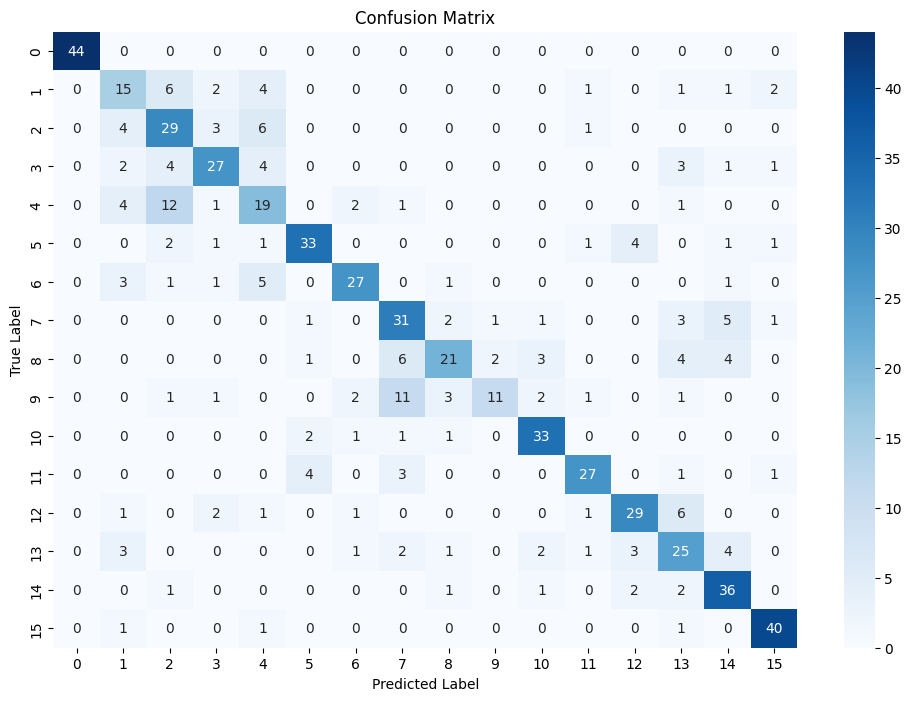


Classification Report:
                                          precision    recall  f1-score   support

              AM General Hummer SUV 2000       1.00      1.00      1.00        44
                     Acura RL Sedan 2012       0.45      0.47      0.46        32
                     Acura TL Sedan 2012       0.52      0.67      0.59        43
                    Acura TL Type-S 2008       0.71      0.64      0.68        42
                    Acura TSX Sedan 2012       0.46      0.47      0.47        40
               Acura Integra Type R 2001       0.80      0.75      0.78        44
                Acura ZDX Hatchback 2012       0.79      0.69      0.74        39
Aston Martin V8 Vantage Convertible 2012       0.56      0.69      0.62        45
      Aston Martin V8 Vantage Coupe 2012       0.70      0.51      0.59        41
    Aston Martin Virage Convertible 2012       0.79      0.33      0.47        33
          Aston Martin Virage Coupe 2012       0.79      0.87      0.82  

array([[44,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 15,  6,  2,  4,  0,  0,  0,  0,  0,  0,  1,  0,  1,  1,  2],
       [ 0,  4, 29,  3,  6,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0],
       [ 0,  2,  4, 27,  4,  0,  0,  0,  0,  0,  0,  0,  0,  3,  1,  1],
       [ 0,  4, 12,  1, 19,  0,  2,  1,  0,  0,  0,  0,  0,  1,  0,  0],
       [ 0,  0,  2,  1,  1, 33,  0,  0,  0,  0,  0,  1,  4,  0,  1,  1],
       [ 0,  3,  1,  1,  5,  0, 27,  0,  1,  0,  0,  0,  0,  0,  1,  0],
       [ 0,  0,  0,  0,  0,  1,  0, 31,  2,  1,  1,  0,  0,  3,  5,  1],
       [ 0,  0,  0,  0,  0,  1,  0,  6, 21,  2,  3,  0,  0,  4,  4,  0],
       [ 0,  0,  1,  1,  0,  0,  2, 11,  3, 11,  2,  1,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  0,  2,  1,  1,  1,  0, 33,  0,  0,  0,  0,  0],
       [ 0,  0,  0,  0,  0,  4,  0,  3,  0,  0,  0, 27,  0,  1,  0,  1],
       [ 0,  1,  0,  2,  1,  0,  1,  0,  0,  0,  0,  1, 29,  6,  0,  0],
       [ 0,  3,  0,  0,  0,  0,  1,  2,  1,  0,  2,

In [ ]:
evaluate_model(loaded_resnet_best_model,test_ds,idx_to_class)

## Insights and Observations

**THE FINETUNING APPROACH:**

For Finetuning, HyperParameter tuning approach is chosen and below are a few parameters considered for this task.
- Learning rate
- Dropout rate
- Dense layer units

Extra layers such as below are also added to the models.
- Dense layers with extra units
- Dropout
- BatchNormalisation
- Internal layers have the 'ReLu' activation added

Keras Tuner framework from Tensorflow/Keras models is used for optimising the hyperparameters. It works best with Tensorflow models which have been used in this project. Below search algorithms were incorporated for the finding the best parameter combination of the hyperparameters.
- Hyperband
- RandomSearch


The model training also had the below callbacks implemented for accuracy boost.
- ReduceLROnPlateau
- Early stopping
- ModelCheckpoint: To pick up the training from the prev checkpoint and also save the model with the improval val_accuracy for further runs


Research papers Referred:

https://arxiv.org/pdf/2009.08453




# Step 2: Design, train and test RCNN based object detection models to impose the bounding box.

## Data Processing

In [ ]:
#    Load car images and annotations from the Train and test data folder
def load_car_data(base_dir):
    # Capture the data folders paths
    extract_path = os.path.join(base_dir, 'car_data')
    annotation_dir = os.path.join(base_dir, 'annotations', 'Annotations')

    # Load annotations
    print("Loading annotations...")
    train_annot = pd.read_csv(os.path.join(annotation_dir, 'Train Annotations.csv'))
    test_annot = pd.read_csv(os.path.join(annotation_dir, 'Test Annotation.csv'))

    def collect_image_paths(directory):
        image_paths = []
        for car_model in os.listdir(directory):
            car_model_path = os.path.join(directory, car_model)
            if os.path.isdir(car_model_path):
                for image in os.listdir(car_model_path):
                    if image.lower().endswith(('.png', '.jpg', '.jpeg')) and not image.startswith('.'):
                        image_paths.append({
                            'path': os.path.join(car_model_path, image),
                            'class': car_model,
                            'filename': image
                        })
        return image_paths

    # Collect image paths
    print("\nCollecting image paths...")
    train_dir = os.path.join(extract_path, 'Car Images', 'Train Images')
    test_dir = os.path.join(extract_path, 'Car Images', 'Test Images')

    train_images = collect_image_paths(train_dir)
    test_images = collect_image_paths(test_dir)

    #Creating the bounding box dictionary for easy computation in later phases
    def process_annotations(df):
        bbox_dict = {}
        for idx, row in df.iterrows():
            img_name = row['Image Name']
            bbox = [
                row['Bounding Box coordinates'],  # x1
                row['Unnamed: 2'],                # y1
                row['Unnamed: 3'],                # x2
                row['Unnamed: 4']                 # y2
            ]
            bbox_dict[img_name] = {
                'bbox': bbox,
                'class_idx': row['Image class']
            }
        return bbox_dict

    # Create bbox mappings
    print("\nProcessing annotations...")
    train_bbox_mapping = process_annotations(train_annot)
    test_bbox_mapping = process_annotations(test_annot)

    # Verify data integrity
    print("\nVerifying data integrity...")
    train_verified = all(img['filename'] in train_bbox_mapping for img in train_images)
    test_verified = all(img['filename'] in test_bbox_mapping for img in test_images)

    if not (train_verified and test_verified):
        raise ValueError("Data integrity check failed! Some images are missing annotations.")

    print("\nDataset Statistics:")
    print(f"Training images: {len(train_images)}")
    print(f"Testing images: {len(test_images)}")
    print(f"Training annotations: {len(train_bbox_mapping)}")
    print(f"Testing annotations: {len(test_bbox_mapping)}")

    return train_images, train_bbox_mapping, test_images, test_bbox_mapping

In [ ]:
#Verify if the bbox data are captured and they are valid
def verify_bbox(image_info, bbox_mapping):
    img = cv2.imread(image_info['path'])
    if img is None:
        return {'valid': False, 'error': 'Could not read image'}

    height, width = img.shape[:2]
    bbox = bbox_mapping[image_info['filename']]['bbox']
    x1, y1, x2, y2 = map(int, bbox)

    is_valid = (0 <= x1 < width and 0 <= x2 < width and
               0 <= y1 < height and 0 <= y2 < height and
               x1 < x2 and y1 < y2)

    return {
        'valid': is_valid,
        'image_size': (width, height),
        'bbox': (x1, y1, x2, y2)
    }

In [ ]:
BASE_DIR = "/content/drive/MyDrive/GL_Capstone_project_Feb24B"

# Load the data
train_images, train_bbox_mapping, test_images, test_bbox_mapping = load_car_data(BASE_DIR)

# Verify a sample image
if train_images:
    sample_img = train_images[0]
    print("\nSample image verification:")
    print(f"Image path: {sample_img['path']}")
    print(f"Class: {sample_img['class']}")
    verification = verify_bbox(sample_img, train_bbox_mapping)
    print(f"Bounding box valid: {verification['valid']}")
    if verification['valid']:
        print(f"Image size: {verification['image_size']}")
        print(f"Bounding box: {verification['bbox']}")

Loading annotations...


Processing annotations...

Verifying data integrity...

Dataset Statistics:
Training images: 8144
Testing images: 8041
Training annotations: 8144
Testing annotations: 8041

Sample image verification:
Image path: /content/drive/MyDrive/GL_Capstone_project_Feb24B/car_data/Car Images/Train Images/Volkswagen Golf Hatchback 2012/00805.jpg
Class: Volkswagen Golf Hatchback 2012
Bounding box valid: True
Image size: (300, 173)
Bounding box: (15, 32, 296, 149)


## Fast RCNN Models Design, Train and Test for Object Detection

### FAST RCNN with MobileNetV2 and ResNet50 as Backbone

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, Model
import numpy as np
from tensorflow.keras.applications import ResNet50, MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import cv2
import matplotlib.pyplot as plt
from tqdm import tqdm

In [ ]:
class FastRCNNModel:
    def __init__(self, num_classes=16, img_height=224, img_width=224, backbone='resnet50'):
        self.num_classes = num_classes
        self.img_height = img_height
        self.img_width = img_width
        self.backbone = backbone
        self.roi_size = (7, 7)

    def get_backbone(self):
        """Get the backbone model based on selection"""
        if self.backbone == 'resnet50':
            base_model = ResNet50(
                include_top=False,
                weights='imagenet',
                input_shape=(self.img_height, self.img_width, 3)
            )
            # Freeze early layers
            for layer in base_model.layers[:100]:
                layer.trainable = False
        else:  # mobilenetv2
            base_model = MobileNetV2(
                include_top=False,
                weights='imagenet',
                input_shape=(self.img_height, self.img_width, 3)
            )
            # Freeze early layers
            for layer in base_model.layers[:100]:
                layer.trainable = False

        return base_model

    def build_model(self):
        # Input layers
        input_image = layers.Input(shape=(self.img_height, self.img_width, 3), name='input_image')
        input_rois = layers.Input(shape=(4,), name='input_rois')

        # Get selected backbone
        base_model = self.get_backbone()

        # Get feature map from base network
        x = base_model(input_image)

        # Global pooling
        x = layers.GlobalAveragePooling2D()(x)

        # Dense layers with regularization
        x = layers.Dense(1024, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)
        x = layers.Dense(512, activation='relu')(x)
        x = layers.BatchNormalization()(x)
        x = layers.Dropout(0.5)(x)

        # Classification head
        outputs = layers.Dense(self.num_classes, activation='softmax', name='class_output')(x)

        # Create model
        model = Model(inputs=[input_image, input_rois], outputs=outputs)

        # Compile with mixed precision
        optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)
        model.compile(
            optimizer=optimizer,
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy']
        )

        return model

    def train(self, train_ds, val_ds, epochs=20):
        model = self.build_model()

        callbacks = [
            EarlyStopping(
                monitor='val_accuracy',
                patience=5,
                restore_best_weights=True,
                verbose=1
            ),
            ReduceLROnPlateau(
                monitor='val_accuracy',
                factor=0.2,
                patience=3,
                min_lr=1e-6,
                verbose=1
            )
        ]

        history = model.fit(
            train_ds,
            validation_data=val_ds,
            epochs=epochs,
            callbacks=callbacks,
            verbose=1
        )

        return model, history

In [ ]:
class FastDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_paths, bbox_mapping, batch_size=16, img_size=(224, 224)):
        # Filter to only include first num_classes classes
        self.image_paths = [img for img in image_paths
                          if bbox_mapping[img['filename']]['class_idx'] <= 16]
        self.bbox_mapping = bbox_mapping
        self.batch_size = batch_size
        self.img_size = img_size
        self.indexes = np.arange(len(self.image_paths))
        np.random.shuffle(self.indexes)

        # Prefetch some data
        self.prefetch_size = min(1000, len(self.image_paths))
        self.prefetched_data = self._prefetch_data()

    def _prefetch_data(self):
        """Prefetch and process some data to speed up training"""
        prefetched = []
        for idx in range(min(self.prefetch_size, len(self.image_paths))):
            path_info = self.image_paths[idx]
            try:
                # Load and preprocess image
                img = tf.keras.preprocessing.image.load_img(
                    path_info['path'],
                    target_size=self.img_size
                )
                img = tf.keras.preprocessing.image.img_to_array(img)
                img = img / 255.0

                # Get bbox and label
                bbox_info = self.bbox_mapping[path_info['filename']]
                bbox = np.array(bbox_info['bbox'], dtype=np.float32)
                label = bbox_info['class_idx'] - 1  # Convert to 0-based indexing

                # Normalize bbox
                bbox = bbox / np.array([self.img_size[1], self.img_size[0],
                                      self.img_size[1], self.img_size[0]])

                prefetched.append({
                    'image': img,
                    'bbox': bbox,
                    'label': label
                })
            except:
                continue
        return prefetched

    def __len__(self):
        return len(self.prefetched_data) // self.batch_size

    def __getitem__(self, idx):
        batch_start = idx * self.batch_size
        batch_end = (idx + 1) * self.batch_size
        batch_data = self.prefetched_data[batch_start:batch_end]

        batch_images = np.array([item['image'] for item in batch_data])
        batch_rois = np.array([item['bbox'] for item in batch_data])
        batch_labels = np.array([item['label'] for item in batch_data])

        return {
            'input_image': batch_images,
            'input_rois': batch_rois
        }, batch_labels

    def on_epoch_end(self):
        np.random.shuffle(self.prefetched_data)




In [ ]:

class FastRCNNEvaluator:
    def __init__(self, model_path, num_classes=16, input_size=(224, 224)):
        self.model = tf.keras.models.load_model(model_path)
        self.num_classes = num_classes
        self.input_size = input_size

    def preprocess_image(self, image_path):
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, self.input_size)
        img = img.astype(np.float32) / 255.0
        return img

    def predict_single_image(self, image_path, bbox):
        # Preprocess image
        img = self.preprocess_image(image_path)
        img_batch = np.expand_dims(img, axis=0)

        # Normalize bbox coordinates
        norm_bbox = bbox / np.array([self.input_size[1], self.input_size[0],
                                   self.input_size[1], self.input_size[0]])
        bbox_batch = np.expand_dims(norm_bbox, axis=0)

        # Make prediction
        predictions = self.model.predict(
            {'input_image': img_batch, 'input_rois': bbox_batch},
            verbose=0
        )

        # Get class prediction
        class_id = np.argmax(predictions)
        confidence = predictions[0][class_id]

        return {
            'class_id': class_id,
            'confidence': confidence,
            'bbox': bbox
        }

    def evaluate_dataset(self, test_images, bbox_mapping):
        results = []
        correct = 0
        total = 0

        for img_info in tqdm(test_images, desc="Evaluating"):
            try:
                # Get ground truth
                bbox_info = bbox_mapping[img_info['filename']]
                gt_class = bbox_info['class_idx'] - 1  # Adjust for 0-based indexing
                bbox = np.array(bbox_info['bbox'], dtype=np.float32)

                # Skip if class_id is greater than num_classes
                if gt_class >= self.num_classes:
                    continue

                # Make prediction
                pred = self.predict_single_image(img_info['path'], bbox)

                # Update metrics
                if pred['class_id'] == gt_class:
                    correct += 1
                total += 1

                # Store result
                results.append({
                    'filename': img_info['filename'],
                    'gt_class': gt_class,
                    'pred_class': pred['class_id'],
                    'confidence': pred['confidence'],
                    'correct': pred['class_id'] == gt_class
                })

            except Exception as e:
                print(f"Error processing {img_info['filename']}: {str(e)}")
                continue

        # Calculate metrics
        accuracy = correct / total if total > 0 else 0

        return {
            'accuracy': accuracy,
            'total_samples': total,
            'correct_predictions': correct,
            'detailed_results': results
        }

    def visualize_predictions(self, image_path, bbox, pred_class, gt_class=None, confidence=None):
        # Read and resize image
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Draw bounding box
        x1, y1, x2, y2 = map(int, bbox)
        cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

        # Prepare labels
        pred_label = f"Class {pred_class}"
        if confidence is not None:
            pred_label += f" ({confidence:.2f})"

        # Draw labels
        cv2.putText(img, f"Pred: {pred_label}", (x1, y1-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        if gt_class is not None:
            gt_label = f"Class {gt_class}"
            cv2.putText(img, f"GT: {gt_label}", (x1, y1-30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        return img

In [ ]:
def train_and_evaluate_models(train_generator, val_generator, num_classes=16):
    """Train and evaluate multiple backbone models"""
    results = {}
    backbones = ['resnet50', 'mobilenetv2']

    for backbone in backbones:
        print(f"\nTraining with {backbone} backbone...")
        model = FastRCNNModel(num_classes=num_classes, backbone=backbone)
        model, history = model.train(train_generator, val_generator)

        # Store results
        results[backbone] = {
            'model': model,
            'history': history,
            'final_train_acc': history.history['accuracy'][-1],
            'final_val_acc': history.history['val_accuracy'][-1],
            'best_val_acc': max(history.history['val_accuracy'])
        }

        # Save the model
        model_filename = f'fast_rcnn_{backbone}.keras'
        model.save(model_filename)
        print(f"Saved model to {model_filename}")

        print(f"\n{backbone} Results:")
        print(f"Final Training Accuracy: {results[backbone]['final_train_acc']:.4f}")
        print(f"Final Validation Accuracy: {results[backbone]['final_val_acc']:.4f}")
        print(f"Best Validation Accuracy: {results[backbone]['best_val_acc']:.4f}")

        # Clear memory
        tf.keras.backend.clear_session()

    return results


Training with resnet50 backbone...
94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 431s 10s/step - accuracy: 0.0666 - loss: 4.3258 - val_accuracy: 0.0500 - val_loss: 2.8519 - learning_rate: 1.0000e-04
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 420s 10s/step - accuracy: 0.0729 - loss: 4.2375 - val_accuracy: 0.0641 - val_loss: 2.8372 - learning_rate: 1.0000e-04
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 393s 10s/step - accuracy: 0.1064 - loss: 3.9102 - val_accuracy: 0.0750 - val_loss: 3.0037 - learning_rate: 1.0000e-04
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 434s 10s/step - accuracy: 0.1360 - loss: 3.5178 - val_accuracy: 0.0641 - val_loss: 2.9091 - learning_rate: 1.0000e-04
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 448s 10s/step - accuracy: 0.1788 - loss: 3.2896 - val_accuracy: 0.0828 - val_loss: 2.8668 - learning_rate: 1.0000e-04
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 434s 10s/step - accuracy: 0.1462 - loss: 3.3088 - val_accuracy: 0.1266 - val_loss: 2.8612 - learning_rate: 1.0000e-04
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 443s 10s/step - accuracy: 0.2402 - lo

Evaluating: 100%|██████████| 8041/8041 [03:19<00:00, 40.28it/s]


Results for resnet50:
Test Accuracy: 0.2307
Total samples: 646
Correct predictions: 149


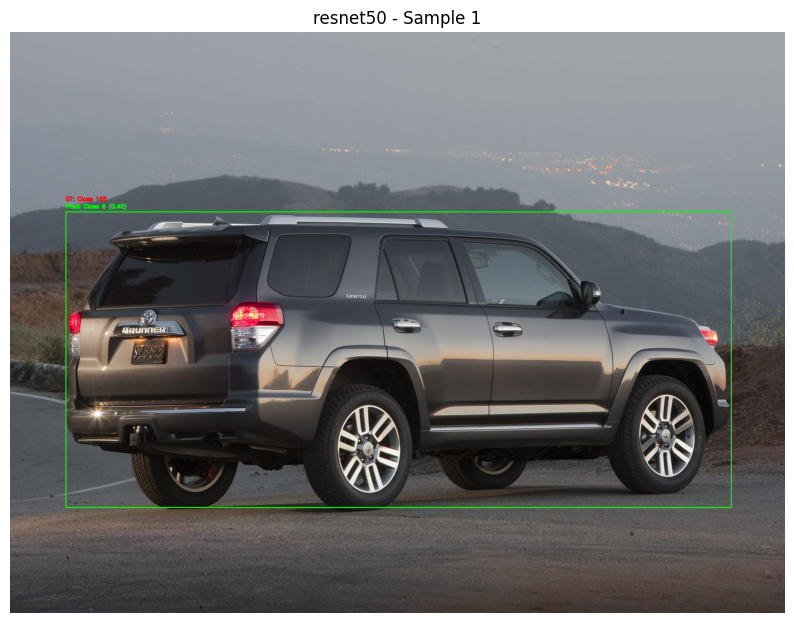

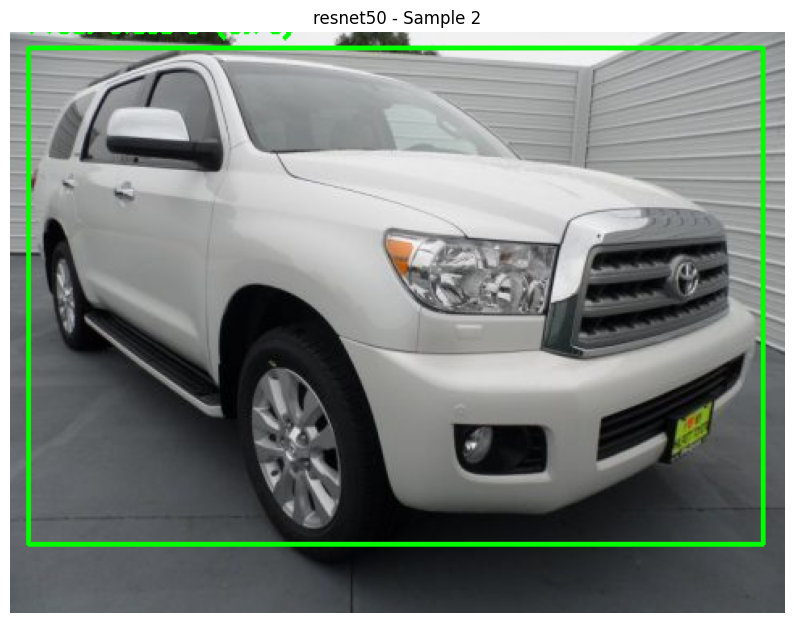

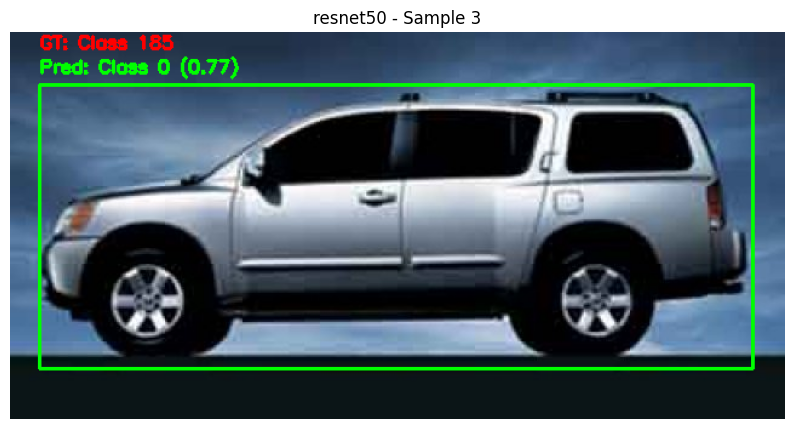

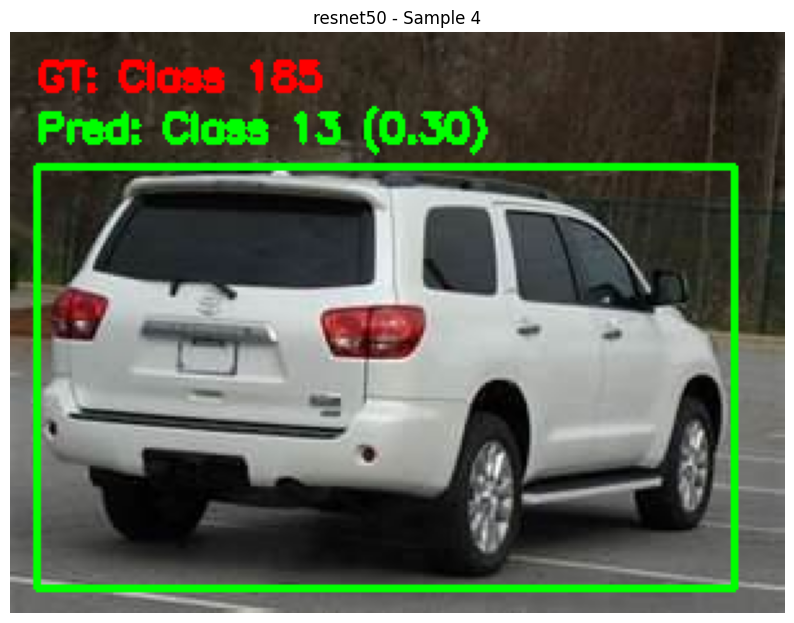

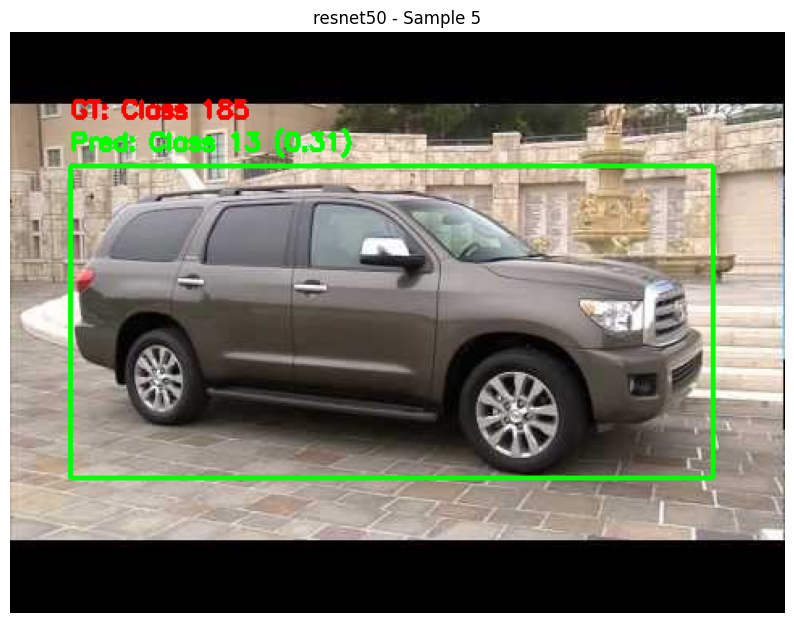


Evaluating mobilenetv2 model...


Evaluating: 100%|██████████| 8041/8041 [01:29<00:00, 89.91it/s]


Results for mobilenetv2:
Test Accuracy: 0.5774
Total samples: 646
Correct predictions: 373


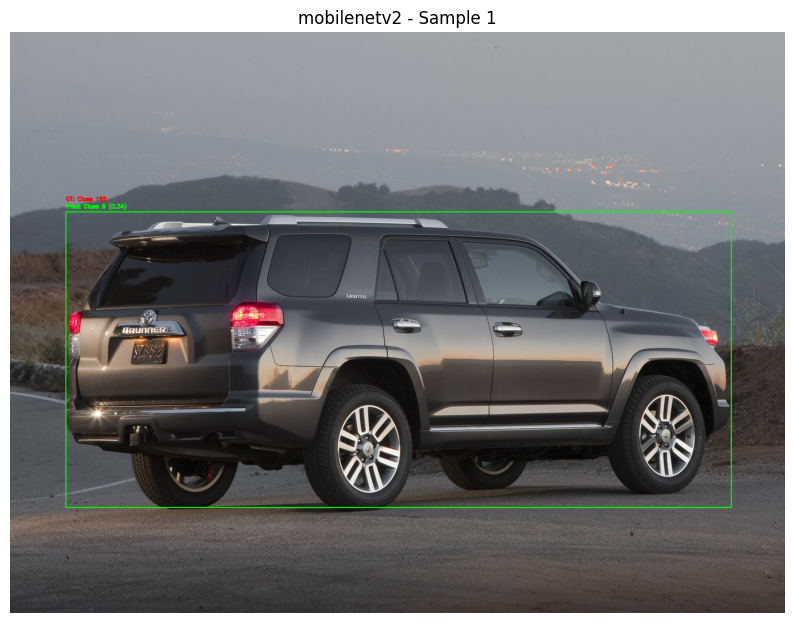

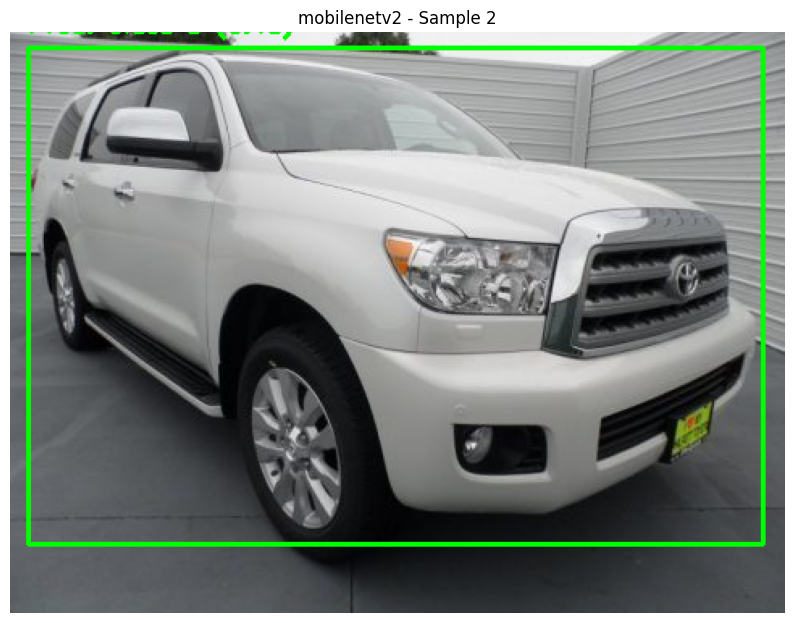

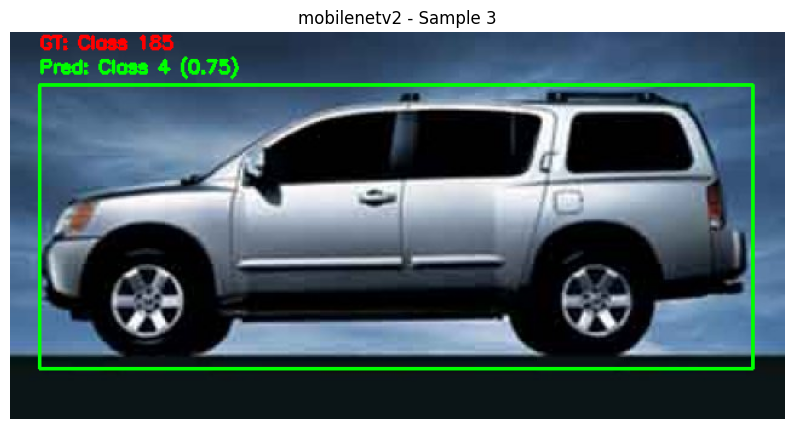

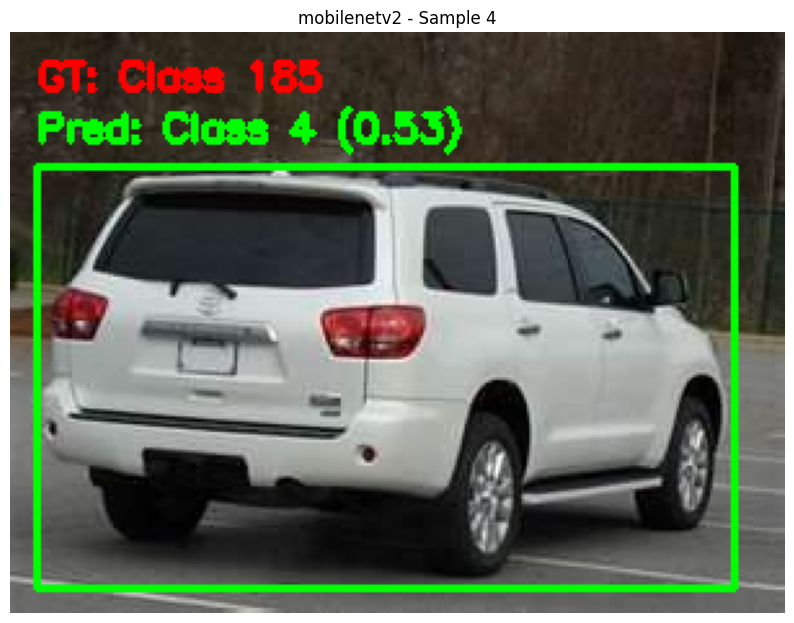

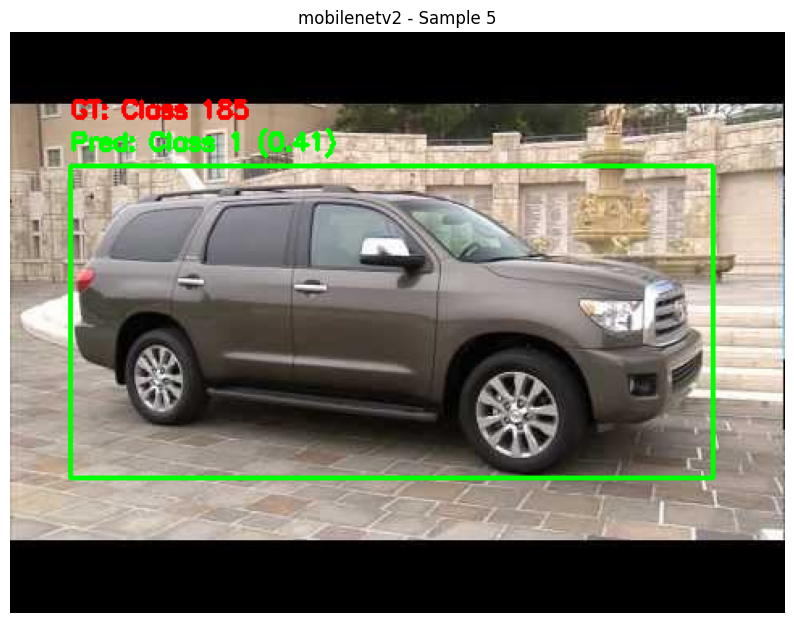

In [ ]:
# Main execution
if __name__ == "__main__":
    # Initialize generators
    train_generator = FastDataGenerator(train_images, train_bbox_mapping, batch_size=16)
    val_generator = FastDataGenerator(test_images, test_bbox_mapping, batch_size=16)

    # Train and evaluate models
    results = train_and_evaluate_models(train_generator, val_generator, num_classes=16)

    # Evaluate saved models
    for backbone in ['resnet50', 'mobilenetv2']:
        print(f"\nEvaluating {backbone} model...")
        model_path = f'fast_rcnn_{backbone}.keras'
        evaluator = FastRCNNEvaluator(model_path)

        # Evaluate on test set
        eval_results = evaluator.evaluate_dataset(test_images, test_bbox_mapping)

        print(f"Results for {backbone}:")
        print(f"Test Accuracy: {eval_results['accuracy']:.4f}")
        print(f"Total samples: {eval_results['total_samples']}")
        print(f"Correct predictions: {eval_results['correct_predictions']}")

        # Visualize some predictions
        sample_count = min(5, len(test_images))
        for i in range(sample_count):
            sample_img = test_images[i]
            bbox_info = test_bbox_mapping[sample_img['filename']]
            pred = evaluator.predict_single_image(sample_img['path'], bbox_info['bbox'])

            img = evaluator.visualize_predictions(
                sample_img['path'],
                bbox_info['bbox'],
                pred['class_id'],
                bbox_info['class_idx'] - 1,
                pred['confidence']
            )

            plt.figure(figsize=(10, 10))
            plt.title(f"{backbone} - Sample {i+1}")
            plt.imshow(img)
            plt.axis('off')
            plt.show()

### FAST RCNN with MobileNetV2 as Backbone

In [ ]:
def train_and_evaluate_models(train_generator, val_generator, num_classes=16):
    """Train and evaluate multiple backbone models"""
    results = {}
    backbones = ['mobilenetv2']

    for backbone in backbones:
        print(f"\nTraining with {backbone} backbone...")
        model = FastRCNNModel(num_classes=num_classes, backbone=backbone)
        model, history = model.train(train_generator, val_generator)

        # Store results
        results[backbone] = {
            'model': model,
            'history': history,
            'final_train_acc': history.history['accuracy'][-1],
            'final_val_acc': history.history['val_accuracy'][-1],
            'best_val_acc': max(history.history['val_accuracy'])
        }

        # Save the model
        model_filename = f'fast_rcnn_{backbone}.keras'
        model.save(model_filename)
        print(f"Saved model to {model_filename}")

        print(f"\n{backbone} Results:")
        print(f"Final Training Accuracy: {results[backbone]['final_train_acc']:.4f}")
        print(f"Final Validation Accuracy: {results[backbone]['final_val_acc']:.4f}")
        print(f"Best Validation Accuracy: {results[backbone]['best_val_acc']:.4f}")

        # Clear memory
        tf.keras.backend.clear_session()

    return results


Training with mobilenetv2 backbone...
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


40/40 ━━━━━━━━━━━━━━━━━━━━ 99s 2s/step - accuracy: 0.0529 - loss: 4.2360 - val_accuracy: 0.0797 - val_loss: 2.8057 - learning_rate: 1.0000e-04
Epoch 2/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 134s 2s/step - accuracy: 0.1259 - loss: 3.7999 - val_accuracy: 0.1688 - val_loss: 2.6238 - learning_rate: 1.0000e-04
Epoch 3/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 77s 2s/step - accuracy: 0.2325 - loss: 2.8690 - val_accuracy: 0.2328 - val_loss: 2.4202 - learning_rate: 1.0000e-04
Epoch 4/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.3342 - loss: 2.2166 - val_accuracy: 0.2547 - val_loss: 2.3161 - learning_rate: 1.0000e-04
Epoch 5/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 73s 2s/step - accuracy: 0.4948 - loss: 1.7556 - val_accuracy: 0.2984 - val_loss: 2.1675 - learning_rate: 1.0000e-04
Epoch 6/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 94s 2s/step - accuracy: 0.5454 - loss: 1.3867 - val_accuracy: 0.3250 - val_loss: 2.0620 - learning_rate: 1.0000e-04
Epoch 7/20
40/40 ━━━━━━━━━━━━━━━━━━━━ 71s 2s/step - accuracy: 0.6169 - loss: 1.0852 - 

Evaluating: 100%|██████████| 8041/8041 [01:41<00:00, 79.03it/s]


Results for mobilenetv2:
Test Accuracy: 0.5805
Total samples: 646
Correct predictions: 375


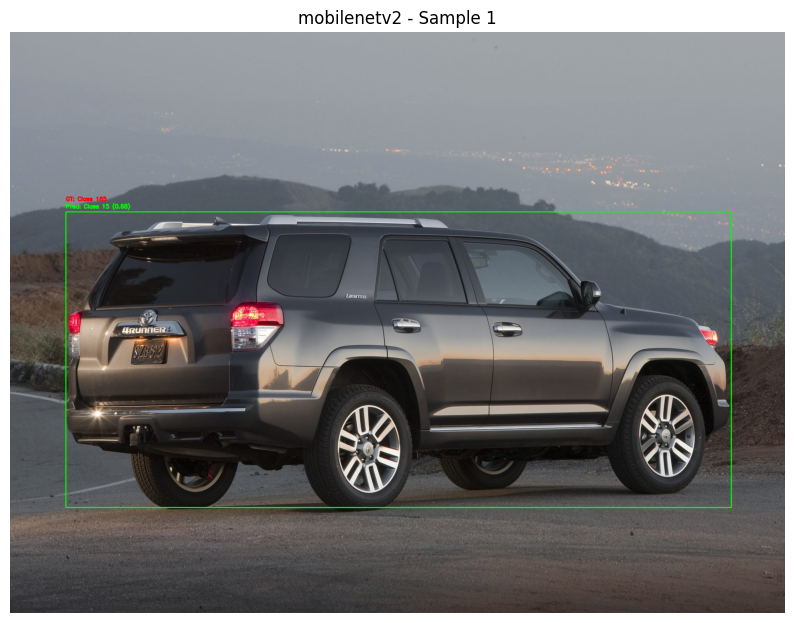

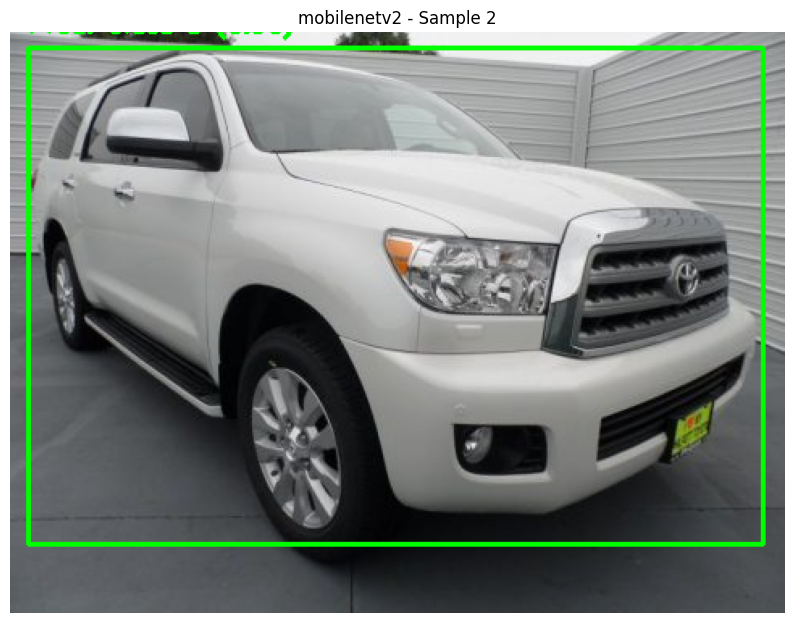

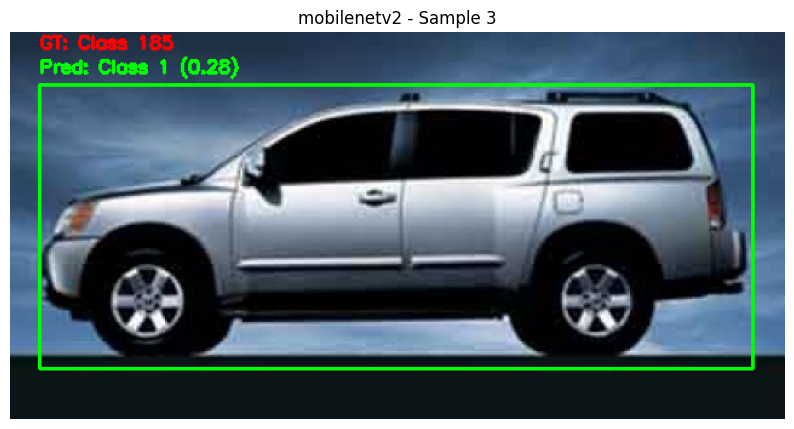

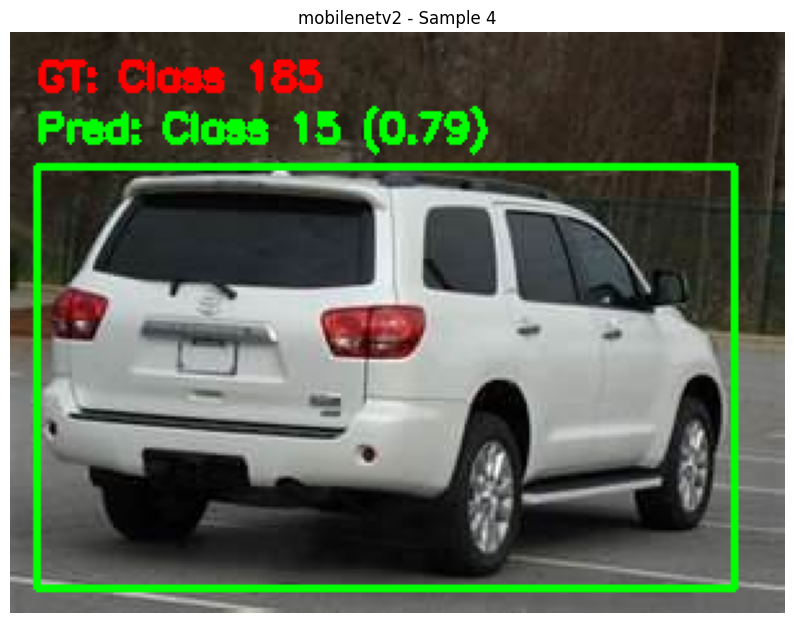

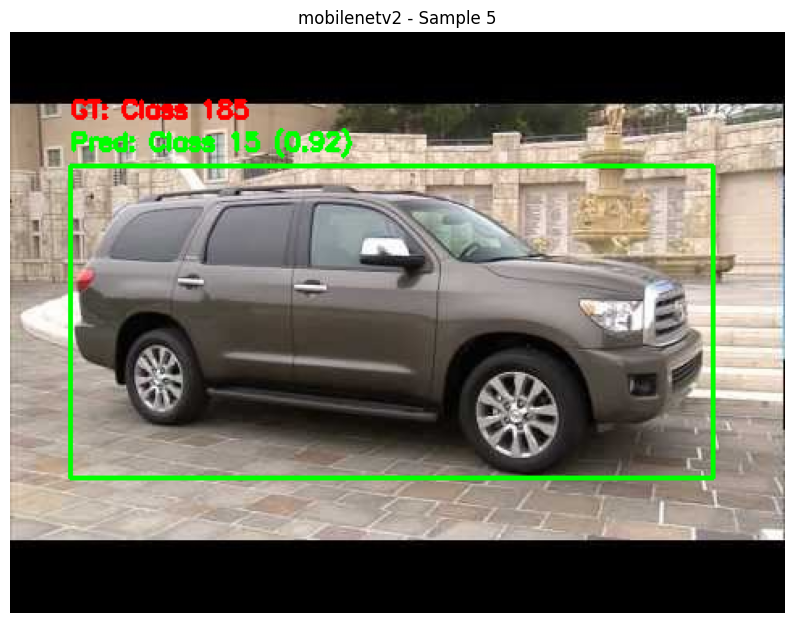

In [ ]:
# Main execution
if __name__ == "__main__":
    # Initialize generators
    train_generator = FastDataGenerator(train_images, train_bbox_mapping, batch_size=16)
    val_generator = FastDataGenerator(test_images, test_bbox_mapping, batch_size=16)

    # Train and evaluate models
    results = train_and_evaluate_models(train_generator, val_generator, num_classes=16)

    # Evaluate saved models
    for backbone in ['mobilenetv2']:
        print(f"\nEvaluating {backbone} model...")
        model_path = f'fast_rcnn_{backbone}.keras'
        evaluator = FastRCNNEvaluator(model_path)

        # Evaluate on test set
        eval_results = evaluator.evaluate_dataset(test_images, test_bbox_mapping)

        print(f"Results for {backbone}:")
        print(f"Test Accuracy: {eval_results['accuracy']:.4f}")
        print(f"Total samples: {eval_results['total_samples']}")
        print(f"Correct predictions: {eval_results['correct_predictions']}")

        # Visualize some predictions
        sample_count = min(5, len(test_images))
        for i in range(sample_count):
            sample_img = test_images[i]
            bbox_info = test_bbox_mapping[sample_img['filename']]
            pred = evaluator.predict_single_image(sample_img['path'], bbox_info['bbox'])

            img = evaluator.visualize_predictions(
                sample_img['path'],
                bbox_info['bbox'],
                pred['class_id'],
                bbox_info['class_idx'] - 1,
                pred['confidence']
            )

            plt.figure(figsize=(10, 10))
            plt.title(f"{backbone} - Sample {i+1}")
            plt.imshow(img)
            plt.axis('off')
            plt.show()

## Detecting bounding boxes with YOLO V3


Processing: 06136.jpg


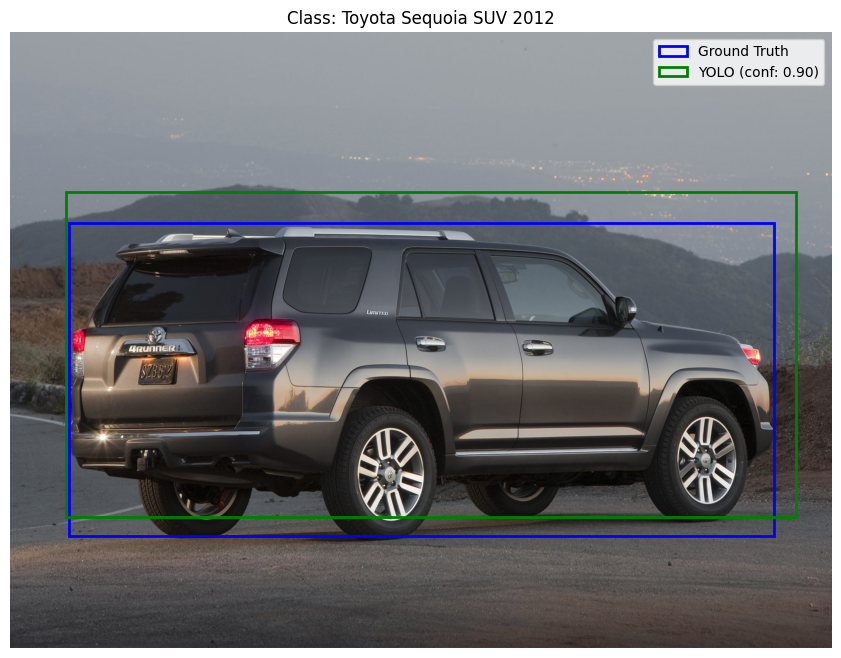


Processing: 07608.jpg


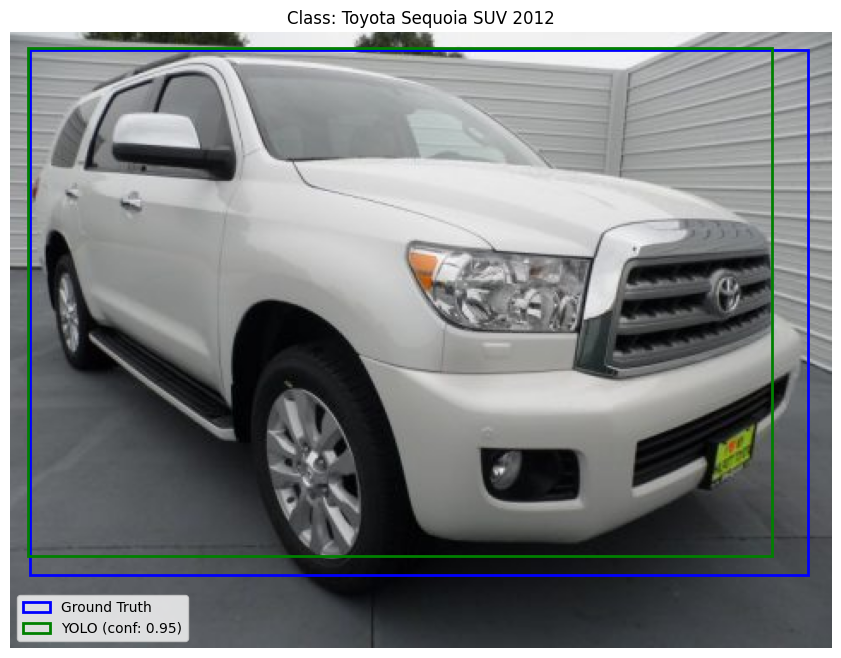


Processing: 00874.jpg


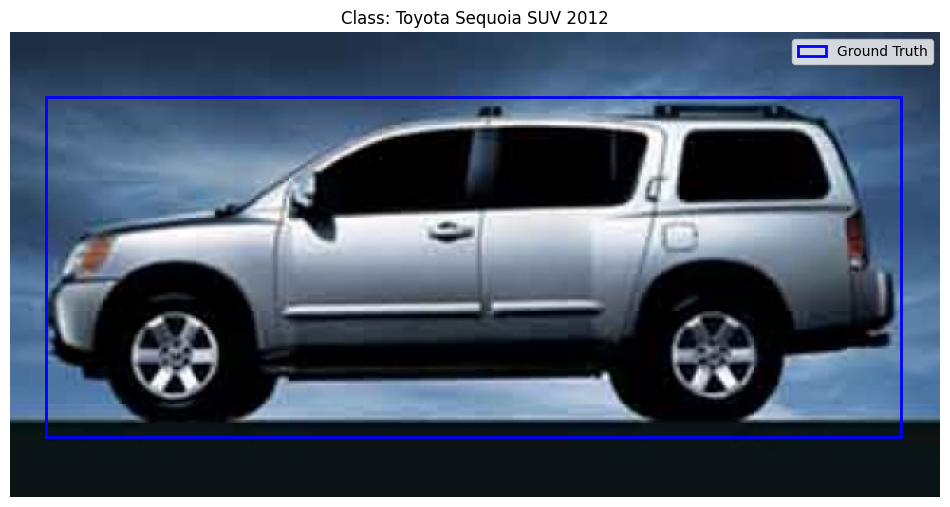


Processing: 04553.jpg


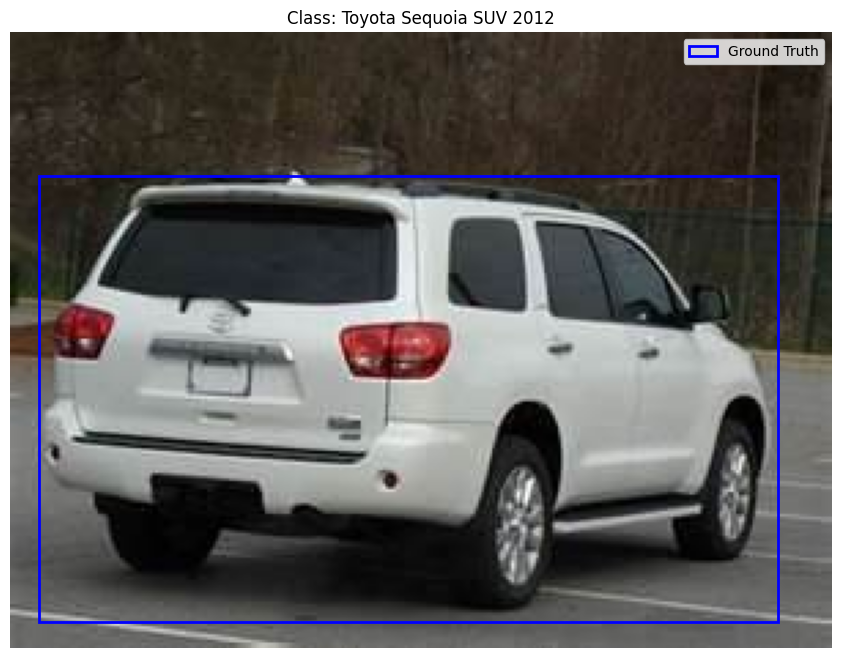


Processing: 05307.jpg


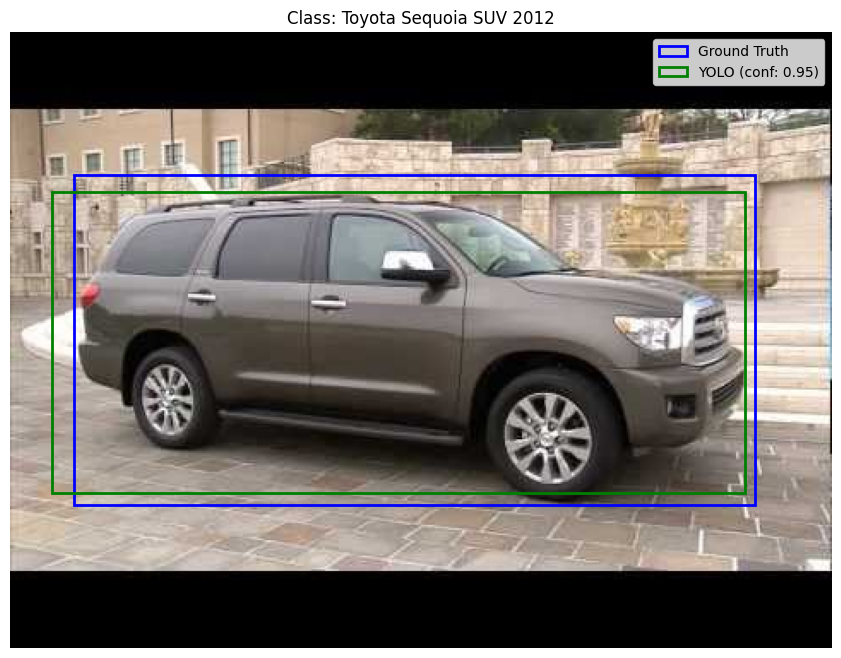

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

class YOLOCompare:
    def __init__(self, confidence_threshold=0.5):
        # Load pre-trained YOLO model
        self.net = cv2.dnn.readNetFromDarknet(
            "yolov3.cfg",
            "yolov3.weights"
        )

        # Load COCO class names
        with open("coco.names", "r") as f:
            self.classes = f.read().strip().split("\n")
        self.car_class_id = self.classes.index('car')

        self.confidence_threshold = confidence_threshold
        self.nms_threshold = 0.4

        # Get output layers
        self.layer_names = self.net.getLayerNames()
        self.output_layers = [self.layer_names[i - 1] for i in self.net.getUnconnectedOutLayers()]

    def detect_and_compare(self, image_info, bbox_mapping):
        """Detect cars and compare with ground truth"""
        # Read image
        image = cv2.imread(image_info['path'])
        if image is None:
            print(f"Error reading image: {image_info['path']}")
            return None

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        height, width = image.shape[:2]

        # Get ground truth bbox
        gt_bbox = bbox_mapping[image_info['filename']]['bbox']
        gt_bbox = [int(x) for x in gt_bbox]

        # Prepare image for YOLO
        blob = cv2.dnn.blobFromImage(image, 1/255.0, (416, 416), swapRB=True, crop=False)
        self.net.setInput(blob)
        outputs = self.net.forward(self.output_layers)

        # Process YOLO detections
        boxes = []
        confidences = []

        for output in outputs:
            for detection in output:
                scores = detection[5:]
                class_id = np.argmax(scores)
                confidence = scores[class_id]

                if class_id == self.car_class_id and confidence > self.confidence_threshold:
                    center_x = int(detection[0] * width)
                    center_y = int(detection[1] * height)
                    w = int(detection[2] * width)
                    h = int(detection[3] * height)

                    x = int(center_x - w/2)
                    y = int(center_y - h/2)

                    boxes.append([x, y, w, h])
                    confidences.append(float(confidence))

        # Apply NMS
        indices = cv2.dnn.NMSBoxes(boxes, confidences, self.confidence_threshold, self.nms_threshold)

        # Draw both ground truth and predictions
        fig, ax = plt.subplots(1, figsize=(12, 8))
        ax.imshow(image)

        # Draw ground truth box in blue
        x1, y1, x2, y2 = gt_bbox
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, color='blue', linewidth=2, label='Ground Truth')
        ax.add_patch(rect)

        # Draw YOLO detections in green
        if len(indices) > 0:
            for i in indices:
                i = i[0] if isinstance(i, (list, np.ndarray)) else i
                x, y, w, h = boxes[i]
                conf = confidences[i]
                rect = plt.Rectangle((x, y), w, h, fill=False, color='green', linewidth=2,
                                   label=f'YOLO (conf: {conf:.2f})')
                ax.add_patch(rect)

        ax.set_title(f"Class: {image_info['class']}")
        ax.legend()
        ax.axis('off')
        plt.show()
        plt.close()

    def evaluate_batch(self, image_list, bbox_mapping, num_samples=5):
        """Evaluate and visualize multiple images"""
        for img_info in image_list[:num_samples]:
            print(f"\nProcessing: {img_info['filename']}")
            self.detect_and_compare(img_info, bbox_mapping)

# Usage:

# Initialize detector
detector = YOLOCompare(confidence_threshold=0.5)

# Compare predictions with ground truth for a few test images
detector.evaluate_batch(test_images, test_bbox_mapping, num_samples=5)


# Step 3: Pickle the model for future prediction

The best performing model is already being saved using multiple approaches like below as the recommended method is to use the built-in keras functions.

These functions are specifically designed for Keras models and handle the architecture, weights, and optimizer configurations seamlessly.
1. ModelCheckpoint Callback
2. model.save() and keras.models.load_model() functions

# THE END

In [1]:
!pip install nbconvert

In [ ]:
!jupyter nbconvert --to html CapstoneProject_MileStone2.ipynb